<a href="https://colab.research.google.com/github/Ed-Cheng/Daily-Stock-Analyser/blob/main/_us_simplified.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Run all


## Install and initialize functions



In [ ]:
pip install mplfinance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 1.8 MB/s eta 0:00:00


In [ ]:
from datetime import datetime, date, timedelta
import io
import math
import matplotlib.pyplot as plt
import matplotlib.image  as m_img
import numpy as np
import pandas as pd
from pandas_datareader import data
import time
from tqdm import tqdm
from IPython.display import Javascript, clear_output
import logging

import mplfinance as fplt
import yfinance as yf


In [ ]:
def get_stock(target_stock: str, start_date: datetime, end_date: datetime) -> pd.DataFrame:
  """ Read the stock data """
  log = logging.getLogger('yfinance').setLevel(logging.CRITICAL)

  yf.pdr_override()
  # read and save pandas df
  df = data.get_data_yahoo([target_stock], start_date, end_date, progress=False)
  # df = data.get_data_yahoo([target_stock], start_date, end_date, progress=False, show_errors=False)
  # fill in missing values, if any
  df = df.interpolate()
  # df.index = pd.to_datetime(df.index)
  # df = df[["Open", "Close", "Volume"]]

  return df


def load_data(symbol_list: list, ago: datetime, tdy: datetime) -> dict:
  """ get all the stock info in the given list """
  # Store stock details for plotting
  detail_dict = {}

  for i, firm in enumerate(tqdm(symbol_list)):
    if firm and "." not in firm:
      stock = get_stock(firm, ago, tdy)
      # if data less than half of the period, issue will be raised
      if len(stock) < (tdy - ago).days/2:
        print(f"'{firm}' skipped due to insufficient data")
      else:
        add_indicator(stock)
        detail_dict[firm] = stock.copy()

  return detail_dict


def get_slope(stock_df: pd.DataFrame, day=5) -> list:
  """
  Calculates the linear regression slope over a period of days
  Note that a 10% growth over 5 days gives a slope of (1.1-1)/5=0.02
  """
  slope = [np.NaN] * (day - 1)
  x = np.vstack([np.arange(day), np.ones(day)]).T
  y = stock_df["Close"].to_numpy()

  for i in np.arange(len(stock_df) - (day - 1)):
    # Very important to normalize
    Y = y[i:i+day]/y[i]
    s, _ = np.linalg.lstsq(x, Y, rcond=None)[0]
    slope.append(s)

  return slope

def get_ma_slope(stock_ls: np) -> int:
  """
  Calculates the linear regression slope over a given list values
  Note that a 10% growth over 5 days gives a slope of (1.1-1)/5=0.02
  """
  stock_ls = stock_ls/stock_ls[0]
  x = np.vstack([np.arange(len(stock_ls)), np.ones(len(stock_ls))]).T
  s, _ = np.linalg.lstsq(x, stock_ls, rcond=None)[0]
  return 100*s

def add_indicator(stock_df: pd.DataFrame) -> None:
  """
  Add indicators to the stock info dataframe
  Includes various info of:
    Price change
    Moving Average
    Volume Moving Average
    Slope
    Bollinger Bands
  """

  stock_df["InDayChg"] = 100*(stock_df["Close"] - stock_df["Open"])/stock_df["Open"]
  stock_df["PriceChg"] = 100*(stock_df["Close"] - stock_df.shift(1)["Close"])/stock_df.shift(1)["Close"]

  indicator_days = [3, 5, 10, 20]
  for days in indicator_days:
    # Price Moving Average (MA)
    stock_df[f"MA{days}"] = stock_df["Close"].rolling(days).mean()

    # Volume Moving Average (VMA)
    stock_df[f"VMA{days}"] = stock_df["Volume"].rolling(days).mean()

    # Volume Moving Average (VMA) relative to today's volume
    stock_df[f"relVMA{days}"] = stock_df["Volume"]/stock_df[f"VMA{days}"]

  stock_df["slope"] = get_slope(stock_df, 5)

  # bollinger-band
  stock_df["STD"] = stock_df["Close"].rolling(20).std()
  stock_df["STD+2"] = stock_df["MA20"] + 2*stock_df["STD"]
  stock_df["STD-2"] = stock_df["MA20"] - 2*stock_df["STD"]
  stock_df["BD%"] = 100 * stock_df["STD"]/stock_df["MA20"]

def candle_plot(stock_df: pd.DataFrame, title: str, pred: list, volatility: str) -> None:
  """
  Plot a candle plot for one ticker
  """
  # This adds a side plot, decide where the plot goes by "panel"
  VMA5 = fplt.make_addplot(stock_df["VMA5"], color="red", width=1.5, panel=1)
  VMA10 = fplt.make_addplot(stock_df["VMA10"], color="orange", width=1.5, panel=1)
  VMA20 = fplt.make_addplot(stock_df["VMA20"], color="purple", width=1.5, panel=1)
  upper = fplt.make_addplot(stock_df["STD+2"], color="grey", width=1, panel=0)
  lower = fplt.make_addplot(stock_df["STD-2"], color="grey", width=1, panel=0)

  # This y lim assure the slope on plots are normalised
  if volatility == "high":
    ylim_window = stock_df["Close"][-1] * 0.8
  elif volatility == "index":
    ylim_window = stock_df["Close"][-1] * 0.15
  else:
    ylim_window = stock_df["Close"][-1] * 0.3

  ylim_max = max(stock_df["High"][-30:])
  ylim_min = min(stock_df["Low"][-30:])
  tune = ((ylim_max - ylim_min) - ylim_window)/2
  ylim_up = (ylim_max - tune)
  ylim_low = (ylim_min + tune)
  # print(stock_df["Close"][-1], ylim_low, ylim_up)
  if stock_df["Low"][-1] < ylim_low or stock_df["High"][-1] > ylim_up:
    print("--- CAUTION --- EXTREME volatility --- CAUTION ---")
    ylim_up = max(stock_df["High"][-30:]) * 1.02
    ylim_low = min(stock_df["Low"][-30:]) * 0.98

  fplt.plot(stock_df,
            type='candle',
            addplot = [upper, lower, VMA5, VMA10, VMA20],
            # style='charles',
            mav=(5, 10, 20),
            mavcolors=["red", "orange", "purple"],
            hlines=dict(hlines=pred,
                        colors=["grey", "red", "orange", "purple", "black"],
                        linewidths=0.5),
            xlim=(len(stock_df)-60, len(stock_df)),
            # This y lim assure the slope on plots are normalised
            ylim=(ylim_low, ylim_up),
            # title=title,
            ylabel=f"Price of {title}",
            volume=True,
            ylabel_lower='Volume')

def display_full_analysis(tickers: list, target_dict: dict, info_dict: dict, volatility: str) -> None:
  """
  Iterate through all the tickers and display the candel plot and slope plot
  info_dict = "chg1", "chg2", "chg3", "chg4", "chg5", "dow", "nas", "snp", "amp1", "amp5", "amp10", "amp20", "slp1", "slp5", "slp10", "slp20"
  """
  for t in tickers:
    contain_idx = ""
    if info_dict[t][5]:
      contain_idx += " dow"
    if info_dict[t][6]:
      contain_idx += " nas"
    if info_dict[t][7]:
      contain_idx += " snp"
    if contain_idx == "":
      contain_idx = "personal list only"

    print(f"{t}, {contain_idx}")
    print(f"recent amp, 1d 5d 10d 20d: {np.round(info_dict[t][8:12], 2)}")
    print(f"5d ma slope, 1m 5m 10m 20m: {np.round(info_dict[t][12:], 2)}")

    bdup = target_dict[t]["STD+2"][-1] * 2 - target_dict[t]["STD+2"][-2]
    pred_5 = target_dict[t]["MA5"][-1] * 2 - target_dict[t]["MA5"][-2]
    pred_10 = target_dict[t]["MA10"][-1] * 2 - target_dict[t]["MA10"][-2]
    pred_20 = target_dict[t]["MA20"][-1] * 2 - target_dict[t]["MA20"][-2]
    min_5d = min(target_dict[t]['Low'][-5:])
    day_price = [target_dict[t]['High'][-1], target_dict[t]['Low'][-1], target_dict[t]['Open'][-1], target_dict[t]['Close'][-1]]
    print(f"H: {day_price[0]:.2f} L: {day_price[1]:.2f} --- O: {day_price[2]:.2f} Mid: {np.mean(day_price[2:]):.2f} C: {day_price[3]:.2f}")
    print(f"pred BDup gry: {bdup:.2f}")
    print(f"pred 5 ma red: {pred_5:.2f}")
    print(f"pred 10ma org: {pred_10:.2f}")
    print(f"pred 20ma pur: {pred_20:.2f}")
    print(f"5 day min blk: {min_5d:.2f}")
    candle_plot(target_dict[t], t, [bdup, pred_5, pred_10, pred_20, min_5d], volatility)


def open_web(target: list):
  for t in target:
    # url1 = f"https://statementdog.com/analysis/{t}/"
    # display(Javascript('window.open("{url}");'.format(url=url1)))

    url2 = f"https://finance.yahoo.com/quote/{t}/chart"
    display(Javascript('window.open("{url}");'.format(url=url2)))

    time.sleep(2)

  time.sleep(2)
  clear_output()

## Webscrape the ticker list (Index, Russell, S&P500...)


In [ ]:
idx_list = ["^GSPC", "^DJI", "^IXIC", "^RUT"]

dow_table = pd.read_html("https://en.wikipedia.org/wiki/Dow_Jones_Industrial_Average")
dow_list = list(dow_table[1]["Symbol"])

nas_table = pd.read_html("https://en.wikipedia.org/wiki/Nasdaq-100")
nas_list = list(nas_table[4]["Ticker"])

snp_table = pd.read_html("https://en.wikipedia.org/wiki/List_of_S%26P_500_companies")
snp_list = list(snp_table[0]["Symbol"])

## Load personal ticker list from google drive (If applicable)
Comment this section out if don't have a personal list

In [ ]:
# Personal tickers
excel_path = "/content/drive/MyDrive/Colab Notebooks/2023-03 Trading/Log_us_20230816.xlsx"
my_df = pd.read_excel(excel_path, "持倉")
hold_df = my_df.dropna(subset = ['ticker'])
print(len(hold_df))

9


In [ ]:
my_df = pd.read_excel(excel_path, "清單")

In [ ]:
full_list = set(idx_list + dow_list + nas_list + snp_list + list(my_df["ticker"]) + list(hold_df["ticker"]))
temp_dict = {key: val for key, val in zip(my_df["ticker"], my_df["level"])}

print(len(full_list))

576


## Check the date for analysis
Check if market is open; the time zone may be different, etc

In [ ]:
tdy = datetime.now()
# Include a day more to deal with time zone issue
tdy = datetime.now() + timedelta(days=1)
# tdy = datetime.now() - timedelta(days=1)

# half a year
qtr = 180
ago = datetime.now() - timedelta(days=qtr)
print(tdy)

2023-09-21 01:19:19.671822


## Load symbols in the list

In [ ]:
# tickers from webscraped list
full_data = load_data(full_list, ago, tdy)

100%|██████████| 576/576 [04:42<00:00,  2.04it/s]


In [ ]:
# My personal lists, when russell is already loaded

hold = list(hold_df["ticker"])
meme = list(my_df.loc[my_df.level.isin(["meme"])]["ticker"])
focus = list(my_df.loc[my_df.level.isin(["focus"])]["ticker"])
snp_list = list(set(snp_list).intersection(full_data.keys()))

# Examine index/ Stat analysis


In [ ]:
# finance event calendar
cal_url = "https://www.dailyfxasia.com/cn/calendar#today"
display(Javascript('window.open("{url}");'.format(url=cal_url)))
time.sleep(2)
clear_output()

## Metadata calculation

In [ ]:
# record the followings:
# 1d~5d change, index it belongs to, all MA amplitude, all MA slope
# columns=["chg1", "chg2", "chg3", "chg4", "chg5", "dow", "nas", "snp", "amp1", "amp5", "amp10", "amp20", "slp1", "slp5", "slp10", "slp20"]
metadata_dict = {}

for t in full_data.keys():
  # "chg1", "chg2", "chg3", "chg4", "chg5"
  temp = list(full_data[t].iloc[-5:]["PriceChg"])

  # "dow", "nas", "snp"
  temp.append(True) if t in dow_list else temp.append(False)
  temp.append(True) if t in nas_list else temp.append(False)
  temp.append(True) if t in snp_list else temp.append(False)

  # "amp1", "amp5", "amp10", "amp20"
  amp = 100 * (full_data[t]["High"] - full_data[t]["Low"])/full_data[t]["Open"]
  temp.append(np.mean(amp[-1]))
  temp.append(np.mean(amp[-5]))
  temp.append(np.mean(amp[-10]))
  temp.append(np.mean(amp[-20]))

  # "slp1", "slp5", "slp10", "slp20"
  temp.append(get_ma_slope(np.array(full_data[t].iloc[-5:]["Close"])))
  temp.append(get_ma_slope(np.array(full_data[t].iloc[-5:]["MA5"])))
  temp.append(get_ma_slope(np.array(full_data[t].iloc[-5:]["MA10"])))
  temp.append(get_ma_slope(np.array(full_data[t].iloc[-5:]["MA20"])))

  metadata_dict[t] = temp


In [ ]:
metadata = pd.DataFrame.from_dict(metadata_dict,
                                  orient='index',
                                  columns=["chg1", "chg2", "chg3", "chg4", "chg5", "dow", "nas", "snp", "amp1", "amp5", "amp10", "amp20", "slp1", "slp5", "slp10", "slp20"])

In [ ]:
def analysis_gain_loss():
  plt.figure(figsize=(21,4))
  for i, idx in enumerate(["dow", "nas", "snp"]):
    gain = []
    loss = []

    cur = metadata[metadata[idx] == True]

    for c in ["chg1", "chg2", "chg3", "chg4", "chg5"]:
      gain.append(len(cur[cur[c] > 0]))
      loss.append(len(cur[cur[c] <= 0]))

    X = full_data["AAPL"][-5:].index.date
    X_axis = np.arange(len(X))

    plt.subplot(1, 3, i+1)

    plt.bar(X_axis - 0.2, gain, 0.4, label = 'gain', color = "lightgreen")
    plt.bar(X_axis + 0.2, loss, 0.4, label = 'loss', color = "lightcoral")

    plt.xticks(X_axis, X)
    plt.title(f"gain/loss of {idx}")
    plt.legend()

  plt.show()


## Plot Calculations

In [ ]:
def get_index_trend(indexes, days):
  index_trend = np.zeros(days)
  for t in indexes:
    month_close = full_data[t]["Close"][-days:] - full_data[t]["Close"][-days]
    month_close = month_close/np.max(abs(month_close))
    index_trend += month_close
  return index_trend/len(indexes)


In [ ]:
trend = dict()

past_days = 95
trend["mem"] = get_index_trend(meme, past_days)
trend["dow"] = get_index_trend(dow_list, past_days)
trend["nas"] = get_index_trend(nas_list, past_days)
trend["snp"] = get_index_trend(snp_list, past_days)
# week, month, quarter
for d in [5, 20, 50]:
  trend[f"mem{d}"] = pd.DataFrame(trend["mem"]).rolling(d).mean()
  trend[f"dow{d}"] = pd.DataFrame(trend["dow"]).rolling(d).mean()
  trend[f"nas{d}"] = pd.DataFrame(trend["nas"]).rolling(d).mean()
  trend[f"snp{d}"] = pd.DataFrame(trend["snp"]).rolling(d).mean()


In [ ]:
def analysis_idx_cross_compare():
  plt.plot(trend["mem5"][-60:], label = "mem5", linewidth=0.5, color='green')
  plt.plot(trend["dow5"][-60:], label = "dow5", linewidth=0.5, color='blue')
  plt.plot(trend["nas5"][-60:], label = "nas5", linewidth=0.5, color='red')
  plt.plot(trend["snp5"][-60:], label = "snp5", linewidth=0.5, color='black')

  plt.xticks(rotation = 45)
  plt.legend()
  plt.show()


In [ ]:
def idx_compare(idx: str, color: str):
  plt.plot(trend[f"{idx}"][-60:], label = f"{idx}", linewidth=0.2, color=color)
  plt.plot(trend[f"{idx}5"][-60:], label = f"{idx}5", linewidth=0.5, color=color)
  plt.plot(trend[f"{idx}20"][-60:], label = f"{idx}20", linewidth=0.5, color=color, linestyle='dashed')
  plt.plot(trend[f"{idx}50"][-60:], label = f"{idx}50", linewidth=1, color=color)

def analysis_idx_indvidual_compare():
  plt.figure(figsize=(20,5))

  pairs = [[1, "mem", "green"], [2, "dow", "blue"], [3, "nas", "red"], [4, "snp", "black"]]
  for p in pairs:
    plt.subplot(1, 4, p[0])
    idx_compare(p[1], p[2])
    plt.legend()
    plt.xticks(rotation = 45)

  plt.show()


## Visualization

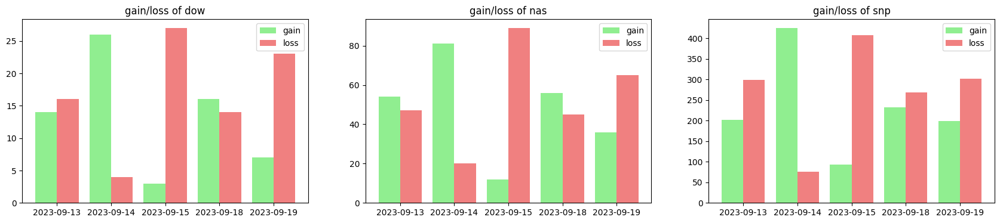

In [ ]:
analysis_gain_loss()

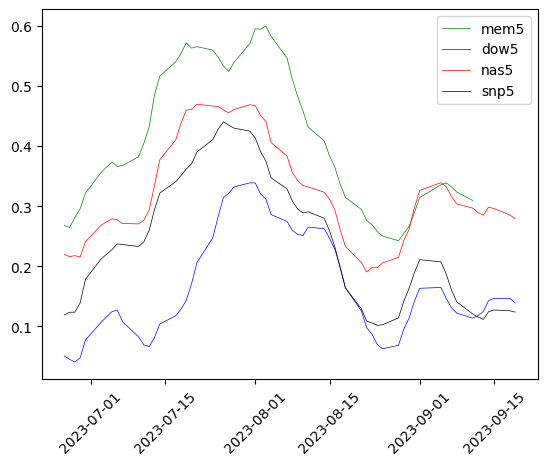

In [ ]:
analysis_idx_cross_compare()

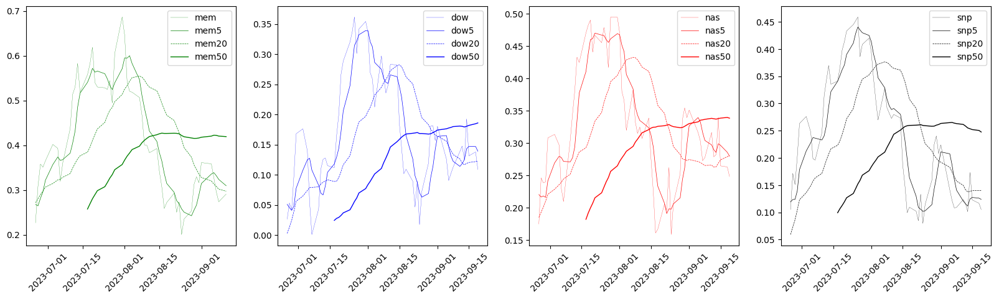

In [ ]:
analysis_idx_indvidual_compare()

^GSPC, personal list only
recent amp, 1d 5d 10d 20d: [0.75 0.58 1.07 0.81]
5d ma slope, 1m 5m 10m 20m: [-0.22 -0.02 -0.11  0.09]
H: 4449.85 L: 4416.61 --- O: 4445.41 Mid: 4444.68 C: 4443.95
pred BDup gry: 4539.52
pred 5 ma red: 4460.48
pred 10ma org: 4459.09
pred 20ma pur: 4462.98
5 day min blk: 4416.61


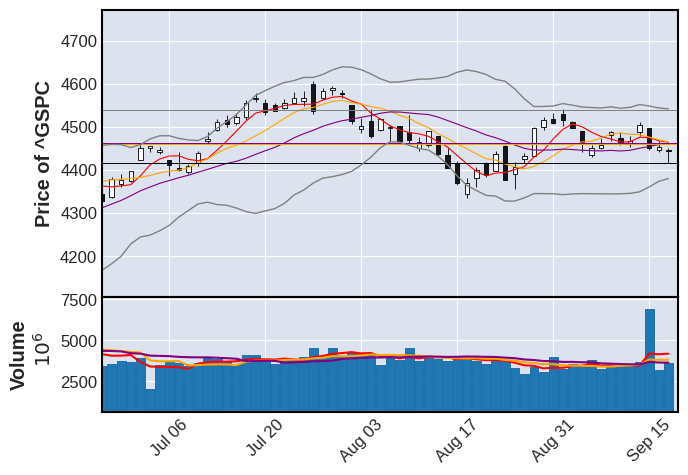

^DJI, personal list only
recent amp, 1d 5d 10d 20d: [0.83 0.74 0.92 0.75]
5d ma slope, 1m 5m 10m 20m: [-0.12  0.03 -0.03  0.02]
H: 34597.56 L: 34311.69 --- O: 34571.84 Mid: 34544.79 C: 34517.73
pred BDup gry: 34997.59
pred 5 ma red: 34622.93
pred 10ma org: 34594.89
pred 20ma pur: 34591.99
5 day min blk: 34311.69


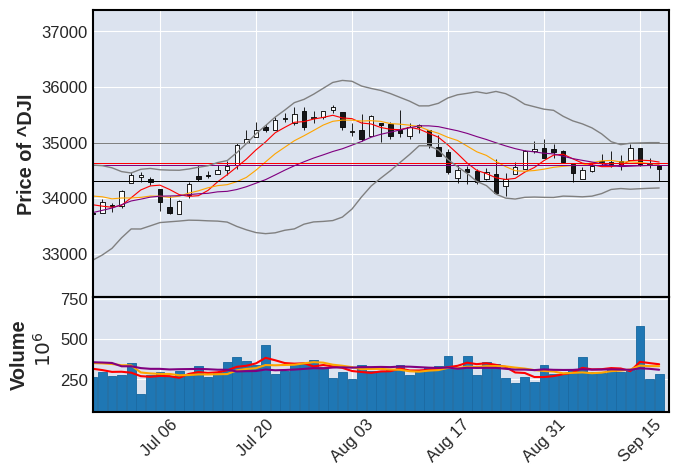

^IXIC, personal list only
recent amp, 1d 5d 10d 20d: [0.93 0.98 1.43 0.84]
5d ma slope, 1m 5m 10m 20m: [-0.35 -0.09 -0.2   0.13]
H: 13705.15 L: 13578.87 --- O: 13649.44 Mid: 13663.82 C: 13678.19
pred BDup gry: 14126.56
pred 5 ma red: 13748.20
pred 10ma org: 13756.80
pred 20ma pur: 13806.44
5 day min blk: 13578.87


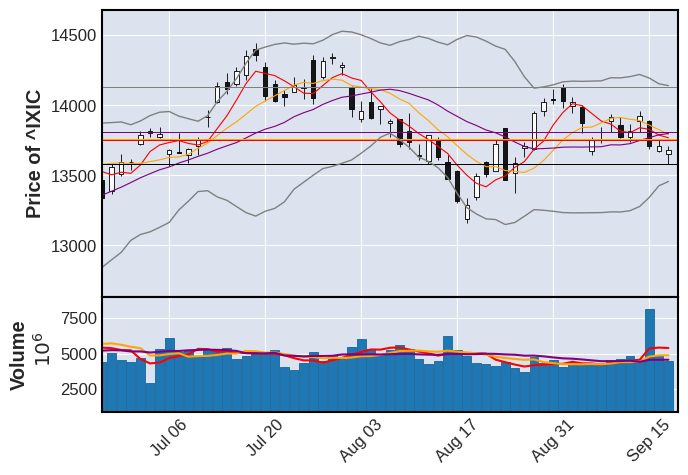

^RUT, personal list only
recent amp, 1d 5d 10d 20d: [0.95 1.05 1.4  1.02]
5d ma slope, 1m 5m 10m 20m: [-0.33 -0.12 -0.32 -0.04]
H: 1840.56 L: 1823.05 --- O: 1834.39 Mid: 1830.46 C: 1826.53
pred BDup gry: 1915.84
pred 5 ma red: 1837.31
pred 10ma org: 1845.35
pred 20ma pur: 1863.37
5 day min blk: 1823.05


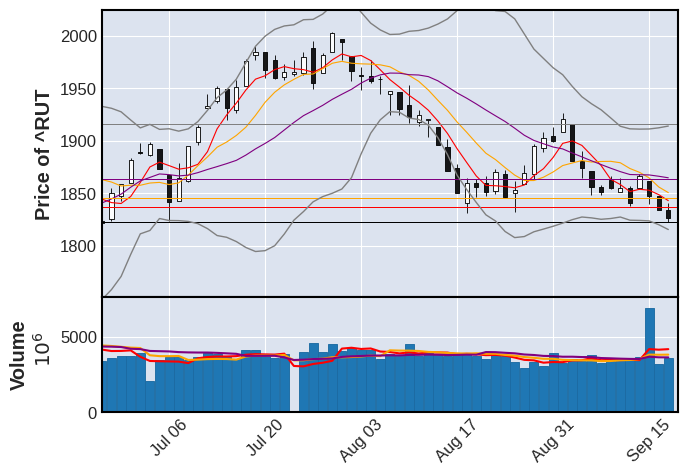

In [ ]:
display_full_analysis(idx_list, full_data, metadata_dict, volatility="index")

# Individual checks

## holding

In [ ]:
# open_web(hold)

AI, personal list only
recent amp, 1d 5d 10d 20d: [4.12 3.66 5.46 6.22]
5d ma slope, 1m 5m 10m 20m: [-0.75 -0.41 -1.28 -0.57]
H: 27.43 L: 26.32 --- O: 26.92 Mid: 27.10 C: 27.27
pred BDup gry: 32.76
pred 5 ma red: 27.38
pred 10ma org: 27.70
pred 20ma pur: 29.18
5 day min blk: 26.32


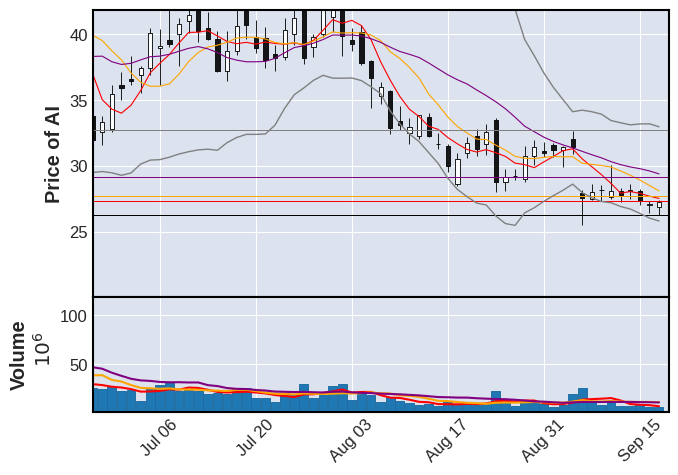

GOOG,  nas snp
recent amp, 1d 5d 10d 20d: [1.21 2.04 2.04 1.57]
5d ma slope, 1m 5m 10m 20m: [0.19 0.26 0.13 0.36]
H: 139.18 L: 137.50 --- O: 138.25 Mid: 138.54 C: 138.83
pred BDup gry: 141.57
pred 5 ma red: 139.07
pred 10ma org: 137.73
pred 20ma pur: 136.21
5 day min blk: 134.93


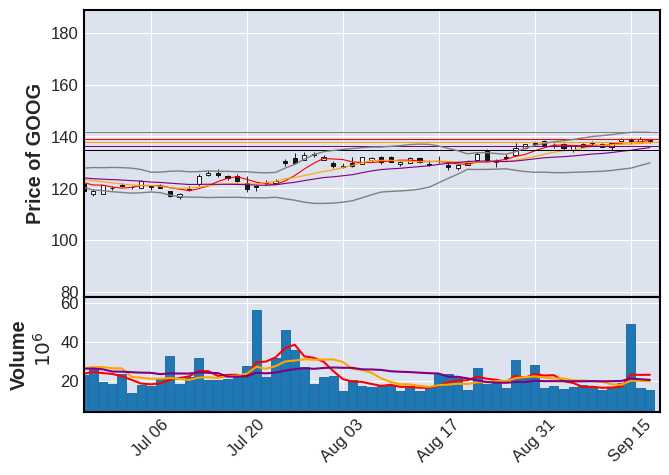

WOLF, personal list only
recent amp, 1d 5d 10d 20d: [3.45 4.48 5.09 3.24]
5d ma slope, 1m 5m 10m 20m: [-2.29 -0.16 -0.97 -0.34]
H: 41.48 L: 40.08 --- O: 40.53 Mid: 40.75 C: 40.97
pred BDup gry: 49.43
pred 5 ma red: 42.17
pred 10ma org: 42.48
pred 20ma pur: 44.54
5 day min blk: 40.08


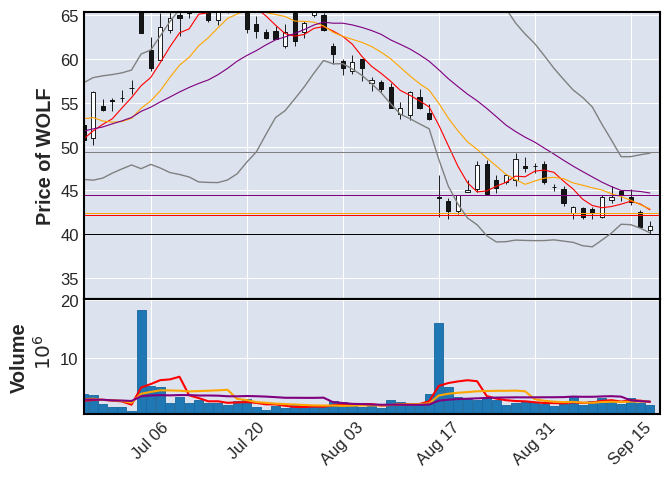

U, personal list only
recent amp, 1d 5d 10d 20d: [4.08 7.57 4.58 4.06]
5d ma slope, 1m 5m 10m 20m: [-2.17 -1.71 -0.68  0.08]
H: 34.48 L: 33.12 --- O: 33.37 Mid: 33.66 C: 33.96
pred BDup gry: 40.11
pred 5 ma red: 34.25
pred 10ma org: 36.36
pred 20ma pur: 36.34
5 day min blk: 32.46


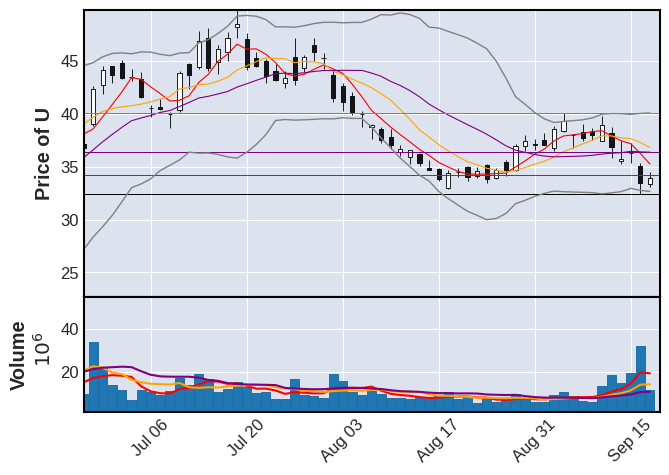

UPST, personal list only
recent amp, 1d 5d 10d 20d: [ 4.53  5.78 10.15  7.09]
5d ma slope, 1m 5m 10m 20m: [-1.51 -1.01 -1.13 -0.48]
H: 29.15 L: 27.85 --- O: 28.70 Mid: 28.62 C: 28.53
pred BDup gry: 34.05
pred 5 ma red: 28.92
pred 10ma org: 29.89
pred 20ma pur: 30.89
5 day min blk: 27.85
--- CAUTION --- EXTREME volatility --- CAUTION ---


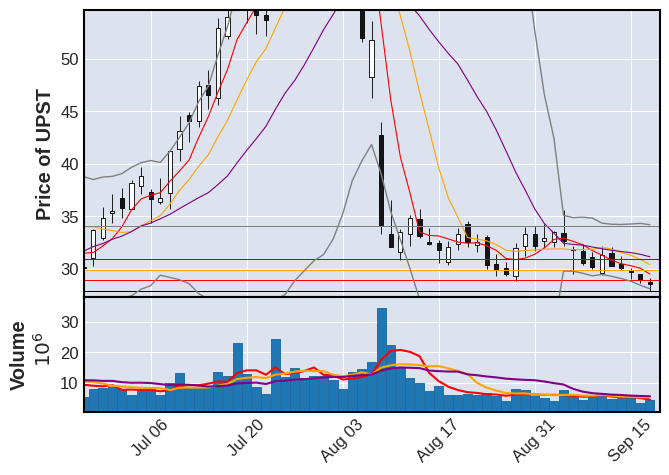

FUBO, personal list only
recent amp, 1d 5d 10d 20d: [ 6.43  7.72 12.71  9.95]
5d ma slope, 1m 5m 10m 20m: [ 2.21 -0.33  0.64  1.31]
H: 2.77 L: 2.59 --- O: 2.72 Mid: 2.73 C: 2.73
pred BDup gry: 3.14
pred 5 ma red: 2.71
pred 10ma org: 2.70
pred 20ma pur: 2.56
5 day min blk: 2.40


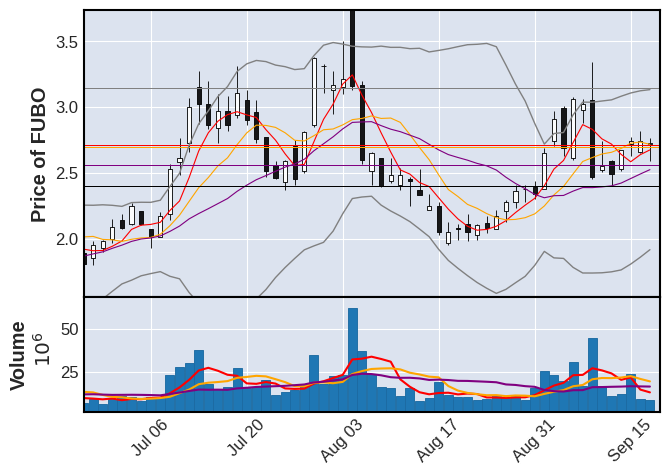

META,  nas snp
recent amp, 1d 5d 10d 20d: [2.1  1.94 2.53 2.1 ]
5d ma slope, 1m 5m 10m 20m: [-0.3   0.17  0.25  0.29]
H: 306.17 L: 299.81 --- O: 302.48 Mid: 303.78 C: 305.07
pred BDup gry: 312.52
pred 5 ma red: 305.62
pred 10ma org: 303.46
pred 20ma pur: 298.73
5 day min blk: 297.80


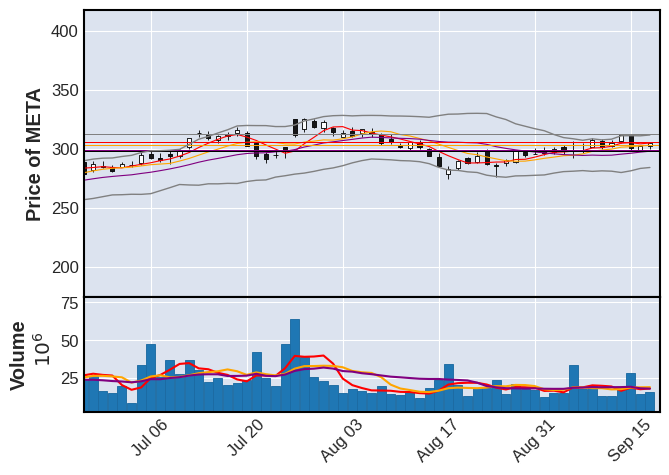

TSLA,  nas snp
recent amp, 1d 5d 10d 20d: [2.52 2.55 4.05 4.69]
5d ma slope, 1m 5m 10m 20m: [-0.75  0.76  0.65  0.99]
H: 267.85 L: 261.20 --- O: 264.35 Mid: 265.43 C: 266.50
pred BDup gry: 284.25
pred 5 ma red: 270.51
pred 10ma org: 265.65
pred 20ma pur: 256.64
5 day min blk: 261.20


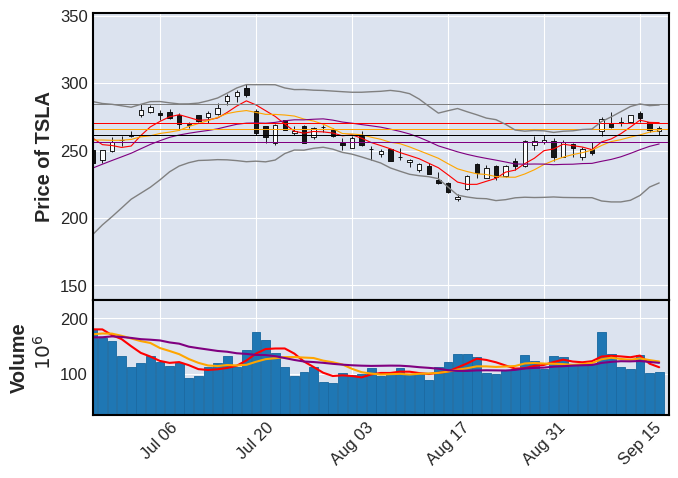

AAPL,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.41 1.88 3.92 0.81]
5d ma slope, 1m 5m 10m 20m: [ 0.69 -0.13 -0.65  0.05]
H: 179.63 L: 177.13 --- O: 177.52 Mid: 178.30 C: 179.07
pred BDup gry: 190.18
pred 5 ma red: 176.95
pred 10ma org: 176.57
pred 20ma pur: 180.59
5 day min blk: 173.58


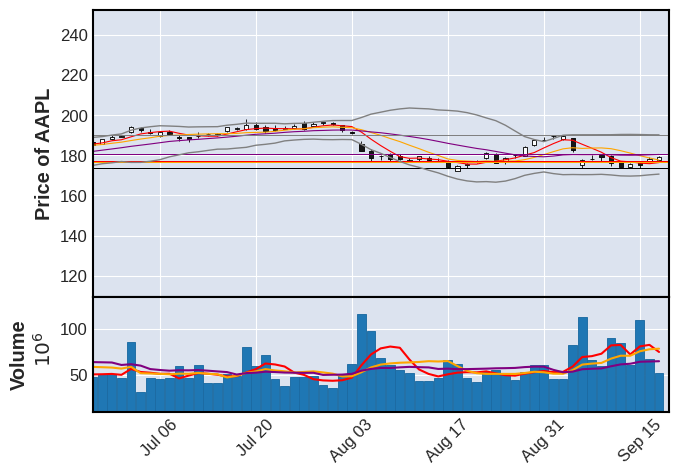

In [ ]:
# For demo purpuse, only show 5
display_full_analysis(hold, full_data, metadata_dict, volatility="high")

## meme

AI, personal list only
recent amp, 1d 5d 10d 20d: [4.12 3.66 5.46 6.22]
5d ma slope, 1m 5m 10m 20m: [-0.75 -0.41 -1.28 -0.57]
H: 27.43 L: 26.32 --- O: 26.92 Mid: 27.10 C: 27.27
pred BDup gry: 32.76
pred 5 ma red: 27.38
pred 10ma org: 27.70
pred 20ma pur: 29.18
5 day min blk: 26.32


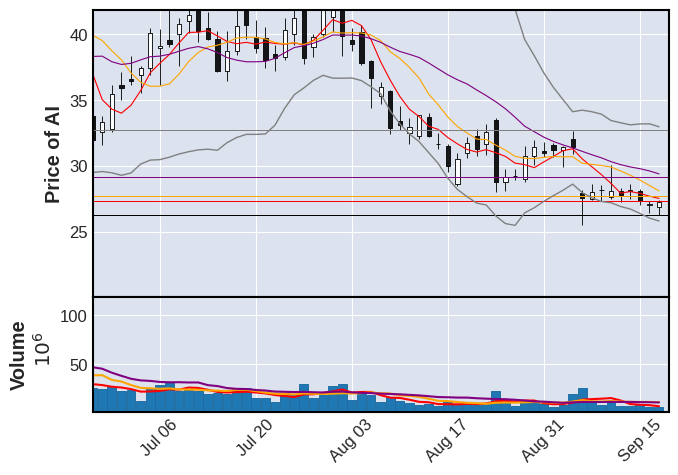

BB, personal list only
recent amp, 1d 5d 10d 20d: [3.46 6.   2.35 3.39]
5d ma slope, 1m 5m 10m 20m: [-1.67  1.39 -0.53  0.91]
H: 5.25 L: 5.07 --- O: 5.20 Mid: 5.16 C: 5.13
pred BDup gry: 5.95
pred 5 ma red: 5.29
pred 10ma org: 5.15
pred 20ma pur: 5.22
5 day min blk: 5.07


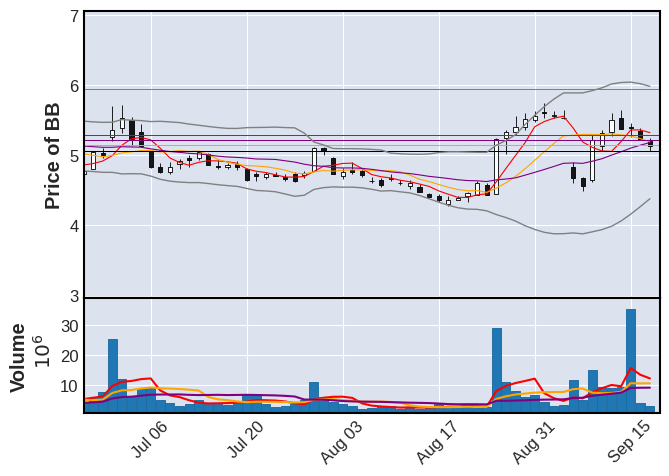

COIN, personal list only
recent amp, 1d 5d 10d 20d: [5.64 4.31 4.16 4.49]
5d ma slope, 1m 5m 10m 20m: [-0.66  0.    0.24  0.38]
H: 82.40 L: 77.77 --- O: 82.15 Mid: 80.14 C: 78.13
pred BDup gry: 86.05
pred 5 ma red: 80.40
pred 10ma org: 80.97
pred 20ma pur: 79.49
5 day min blk: 77.77


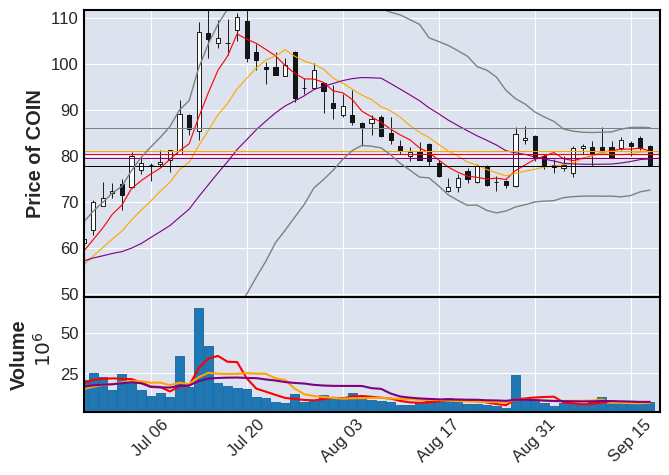

CUK, personal list only
recent amp, 1d 5d 10d 20d: [3.81 2.06 2.51 2.65]
5d ma slope, 1m 5m 10m 20m: [-0.12  0.06 -0.31 -0.21]
H: 14.05 L: 13.53 --- O: 13.64 Mid: 13.64 C: 13.63
pred BDup gry: 14.69
pred 5 ma red: 13.66
pred 10ma org: 13.68
pred 20ma pur: 13.96
5 day min blk: 13.36


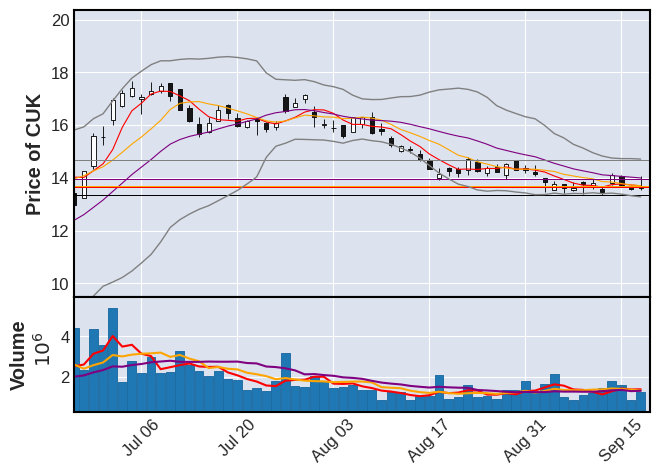

DKNG, personal list only
recent amp, 1d 5d 10d 20d: [4.06 2.91 3.07 3.34]
5d ma slope, 1m 5m 10m 20m: [-0.48 -0.3   0.44  0.72]
H: 31.16 L: 29.90 --- O: 31.04 Mid: 30.57 C: 30.09
pred BDup gry: 32.74
pred 5 ma red: 30.80
pred 10ma org: 31.08
pred 20ma pur: 29.97
5 day min blk: 29.90


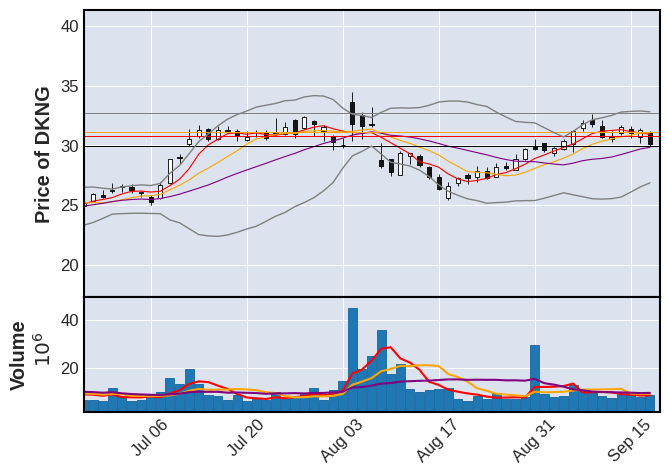

FUBO, personal list only
recent amp, 1d 5d 10d 20d: [ 6.43  7.72 12.71  9.95]
5d ma slope, 1m 5m 10m 20m: [ 2.21 -0.33  0.64  1.31]
H: 2.77 L: 2.59 --- O: 2.72 Mid: 2.73 C: 2.73
pred BDup gry: 3.14
pred 5 ma red: 2.71
pred 10ma org: 2.70
pred 20ma pur: 2.56
5 day min blk: 2.40


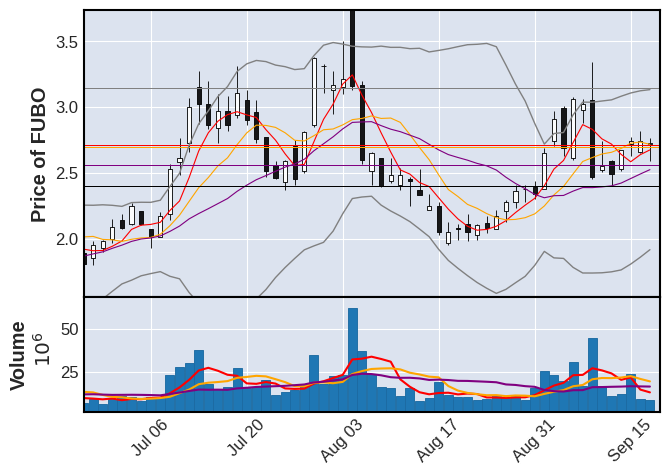

GTLB, personal list only
recent amp, 1d 5d 10d 20d: [ 2.68  3.45 10.95  3.65]
5d ma slope, 1m 5m 10m 20m: [-1.64 -1.45  0.09  0.47]
H: 48.00 L: 46.72 --- O: 47.81 Mid: 47.77 C: 47.72
pred BDup gry: 53.86
pred 5 ma red: 48.18
pred 10ma org: 50.29
pred 20ma pur: 48.62
5 day min blk: 46.72


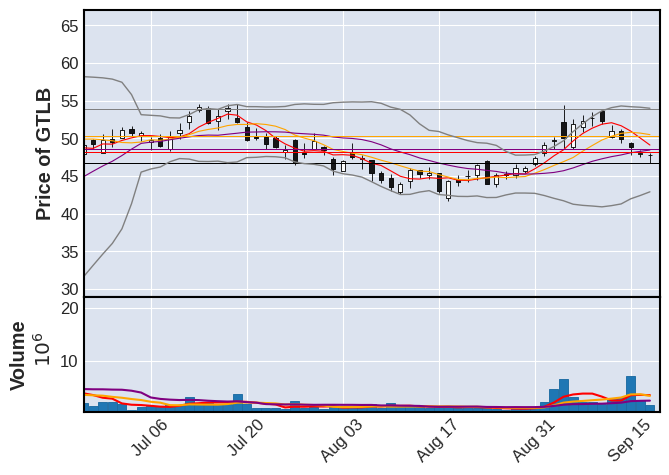

LYFT, personal list only
recent amp, 1d 5d 10d 20d: [5.45 2.79 8.49 5.27]
5d ma slope, 1m 5m 10m 20m: [-0.59  0.09 -0.7  -0.  ]
H: 11.22 L: 10.63 --- O: 10.83 Mid: 11.01 C: 11.19
pred BDup gry: 12.19
pred 5 ma red: 11.14
pred 10ma org: 11.06
pred 20ma pur: 11.12
5 day min blk: 10.63


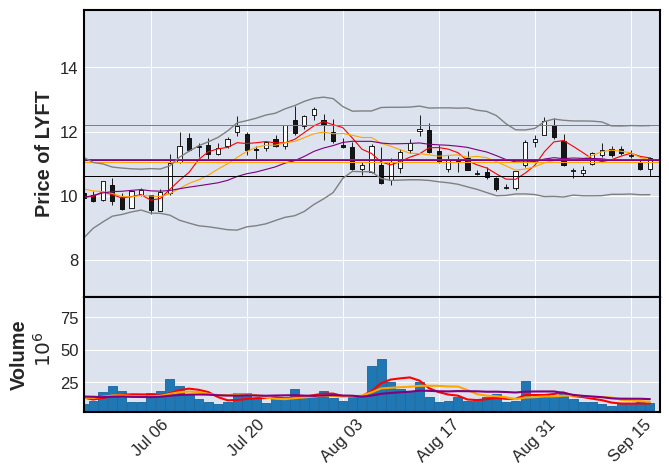

RIOT, personal list only
recent amp, 1d 5d 10d 20d: [6.88 4.63 6.56 4.72]
5d ma slope, 1m 5m 10m 20m: [ 0.27  0.15 -0.48 -0.36]
H: 11.17 L: 10.41 --- O: 11.03 Mid: 10.73 C: 10.44
pred BDup gry: 12.05
pred 5 ma red: 10.66
pred 10ma org: 10.71
pred 20ma pur: 10.90
5 day min blk: 10.22


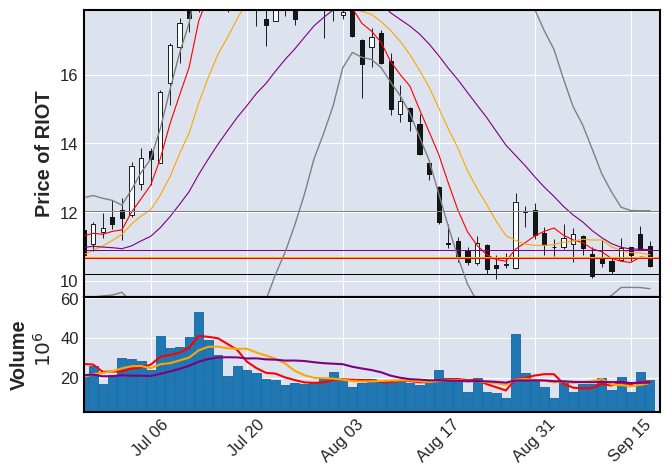

ABNB,  nas snp
recent amp, 1d 5d 10d 20d: [1.97 2.33 2.1  2.61]
5d ma slope, 1m 5m 10m 20m: [-0.5  -0.45  0.63  0.61]
H: 142.57 L: 139.77 --- O: 141.86 Mid: 141.86 C: 141.85
pred BDup gry: 153.51
pred 5 ma red: 142.07
pred 10ma org: 144.12
pred 20ma pur: 138.04
5 day min blk: 139.77


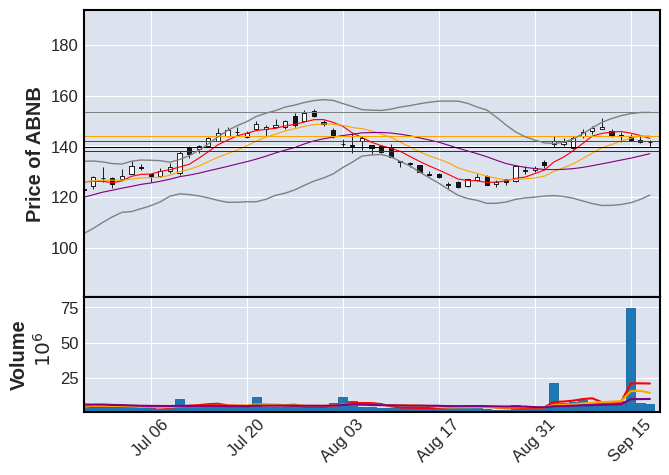

AFRM, personal list only
recent amp, 1d 5d 10d 20d: [8.05 3.96 4.5  8.18]
5d ma slope, 1m 5m 10m 20m: [0.94 1.04 1.39 2.61]
H: 25.13 L: 23.11 --- O: 25.08 Mid: 24.41 C: 23.75
pred BDup gry: 27.91
pred 5 ma red: 24.00
pred 10ma org: 23.64
pred 20ma pur: 21.29
5 day min blk: 23.11


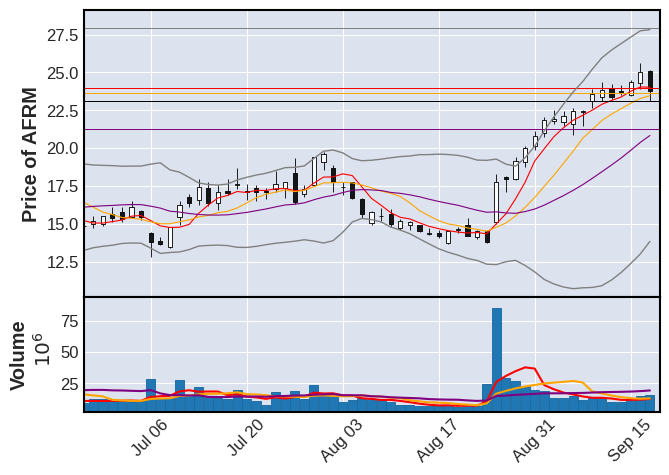

AMC, personal list only
recent amp, 1d 5d 10d 20d: [13.51 12.81 27.95 20.97]
5d ma slope, 1m 5m 10m 20m: [-0.39  1.64 -4.89 -8.75]
H: 8.37 L: 7.33 --- O: 7.70 Mid: 7.97 C: 8.25
pred BDup gry: 15.92
pred 5 ma red: 8.29
pred 10ma org: 7.42
pred 20ma pur: 10.13
5 day min blk: 7.33
--- CAUTION --- EXTREME volatility --- CAUTION ---


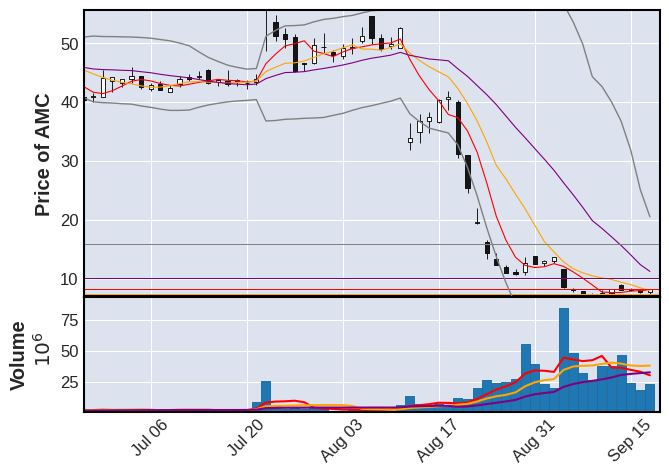

BIGC, personal list only
recent amp, 1d 5d 10d 20d: [2.85 2.02 2.4  3.26]
5d ma slope, 1m 5m 10m 20m: [-1.23 -0.85 -0.34 -0.13]
H: 10.33 L: 10.04 --- O: 10.19 Mid: 10.25 C: 10.31
pred BDup gry: 11.16
pred 5 ma red: 10.38
pred 10ma org: 10.61
pred 20ma pur: 10.64
5 day min blk: 10.04


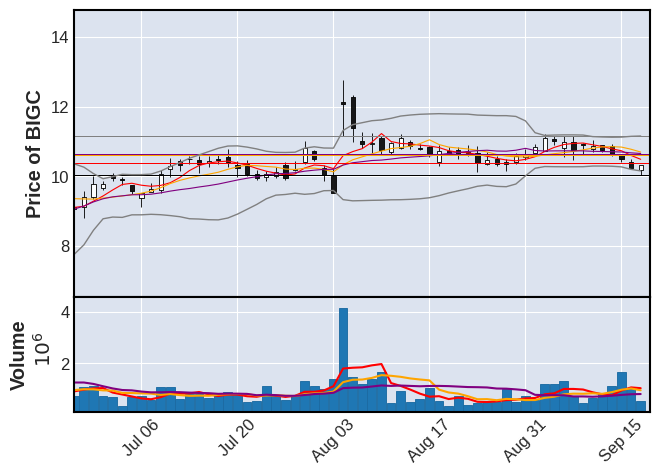

CHPT, personal list only
recent amp, 1d 5d 10d 20d: [3.93 5.47 5.04 4.53]
5d ma slope, 1m 5m 10m 20m: [-2.66 -0.86 -2.62 -1.14]
H: 5.42 L: 5.21 --- O: 5.34 Mid: 5.36 C: 5.37
pred BDup gry: 7.97
pred 5 ma red: 5.58
pred 10ma org: 5.68
pred 20ma pur: 6.41
5 day min blk: 5.21


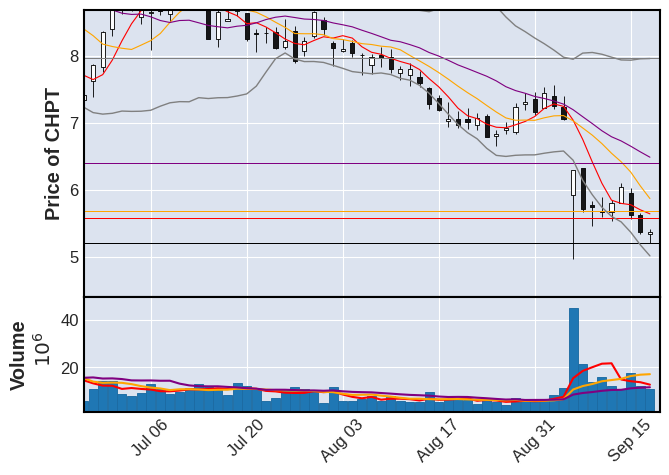

DDOG,  nas
recent amp, 1d 5d 10d 20d: [2.48 2.12 2.74 3.35]
5d ma slope, 1m 5m 10m 20m: [-1.25 -0.82 -0.19  0.13]
H: 94.05 L: 91.72 --- O: 94.00 Mid: 93.44 C: 92.89
pred BDup gry: 100.95
pred 5 ma red: 94.32
pred 10ma org: 96.39
pred 20ma pur: 95.68
5 day min blk: 91.72


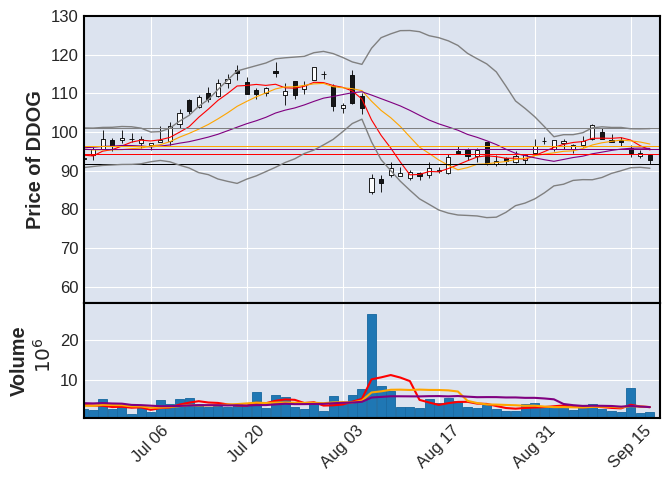

DKS, personal list only
recent amp, 1d 5d 10d 20d: [2.5  2.02 1.72 6.79]
5d ma slope, 1m 5m 10m 20m: [-0.03  0.24 -0.26 -1.41]
H: 113.03 L: 110.27 --- O: 110.41 Mid: 111.52 C: 112.62
pred BDup gry: 103.52
pred 5 ma red: 112.59
pred 10ma org: 111.72
pred 20ma pur: 111.07
5 day min blk: 109.85


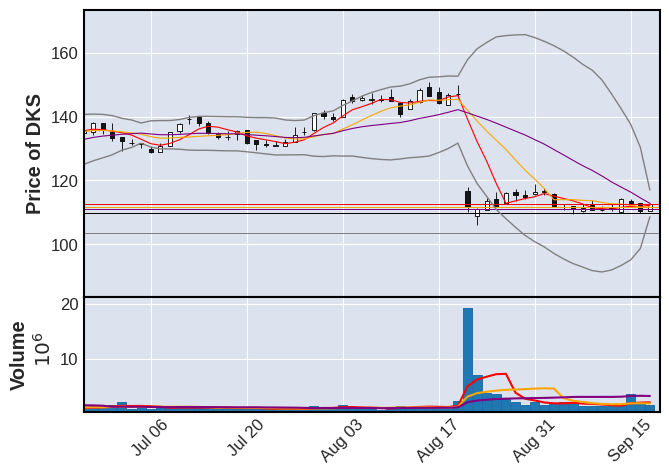

DOCU, personal list only
recent amp, 1d 5d 10d 20d: [2.66 3.23 2.15 2.5 ]
5d ma slope, 1m 5m 10m 20m: [-1.05 -2.   -1.36 -0.41]
H: 44.02 L: 42.87 --- O: 43.20 Mid: 43.44 C: 43.69
pred BDup gry: 53.91
pred 5 ma red: 43.82
pred 10ma org: 46.18
pred 20ma pur: 47.79
5 day min blk: 42.87


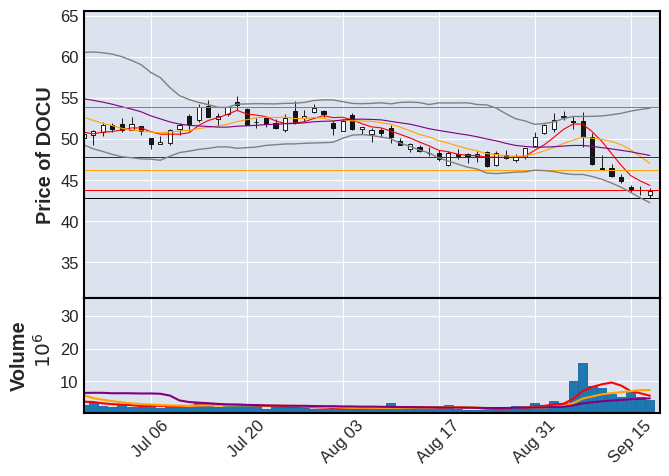

FSLR,  snp
recent amp, 1d 5d 10d 20d: [4.17 6.69 6.33 5.18]
5d ma slope, 1m 5m 10m 20m: [-0.7  -1.04 -0.83 -0.35]
H: 173.65 L: 166.66 --- O: 167.60 Mid: 168.39 C: 169.18
pred BDup gry: 190.90
pred 5 ma red: 169.34
pred 10ma org: 174.73
pred 20ma pur: 178.32
5 day min blk: 166.66


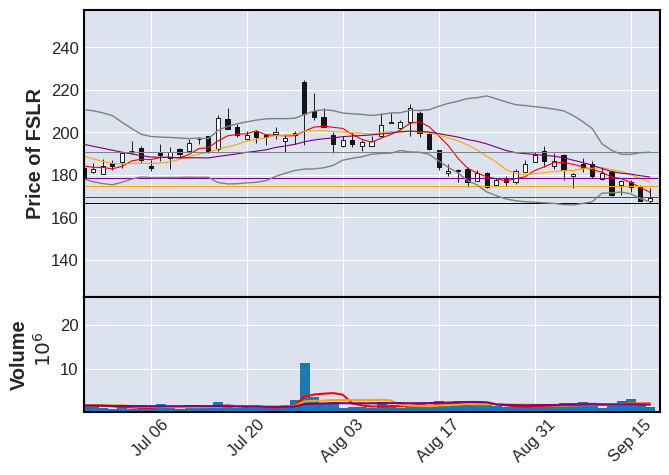

GME, personal list only
recent amp, 1d 5d 10d 20d: [2.9  3.81 3.83 7.36]
5d ma slope, 1m 5m 10m 20m: [-0.76  0.29 -0.39 -0.15]
H: 17.64 L: 17.13 --- O: 17.59 Mid: 17.56 C: 17.52
pred BDup gry: 19.29
pred 5 ma red: 17.94
pred 10ma org: 17.73
pred 20ma pur: 17.80
5 day min blk: 17.13


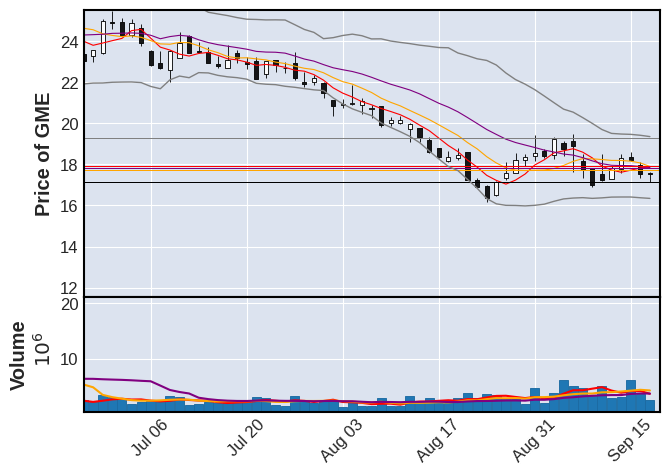

HA, personal list only
recent amp, 1d 5d 10d 20d: [2.72 5.57 6.54 5.91]
5d ma slope, 1m 5m 10m 20m: [-0.46  0.52 -0.7  -0.8 ]
H: 7.82 L: 7.61 --- O: 7.73 Mid: 7.69 C: 7.65
pred BDup gry: 9.34
pred 5 ma red: 7.76
pred 10ma org: 7.71
pred 20ma pur: 8.17
5 day min blk: 7.48


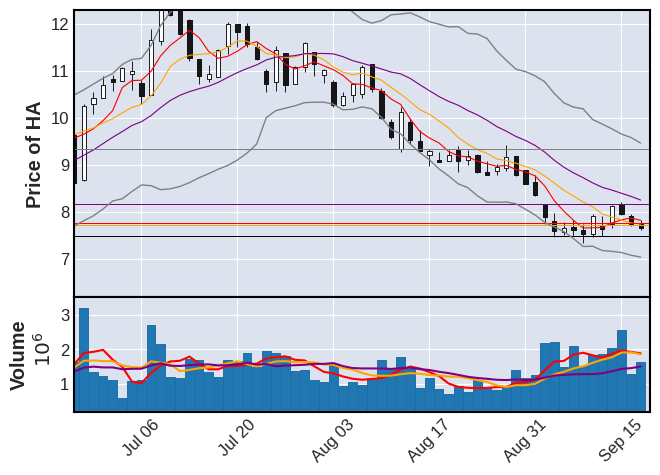

HIMS, personal list only
recent amp, 1d 5d 10d 20d: [3.01 4.34 2.46 6.03]
5d ma slope, 1m 5m 10m 20m: [-0.31 -0.79 -0.79 -0.45]
H: 6.36 L: 6.17 --- O: 6.31 Mid: 6.27 C: 6.24
pred BDup gry: 7.12
pred 5 ma red: 6.27
pred 10ma org: 6.41
pred 20ma pur: 6.62
5 day min blk: 6.17


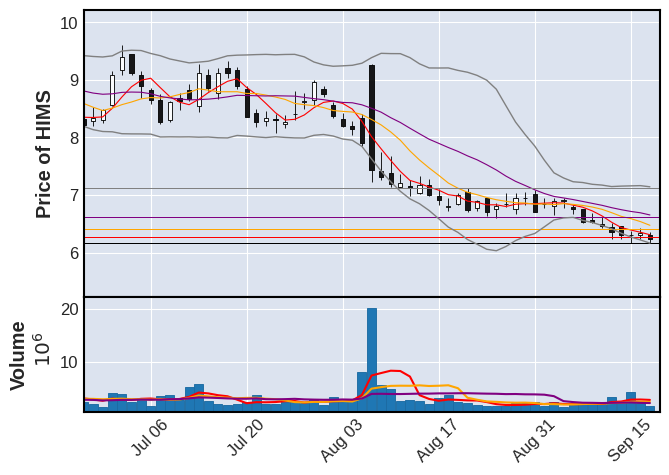

HOOD, personal list only
recent amp, 1d 5d 10d 20d: [2.27 2.05 2.18 2.71]
5d ma slope, 1m 5m 10m 20m: [-0.25 -0.36 -0.36  0.18]
H: 10.60 L: 10.36 --- O: 10.58 Mid: 10.53 C: 10.47
pred BDup gry: 11.13
pred 5 ma red: 10.52
pred 10ma org: 10.65
pred 20ma pur: 10.71
5 day min blk: 10.36


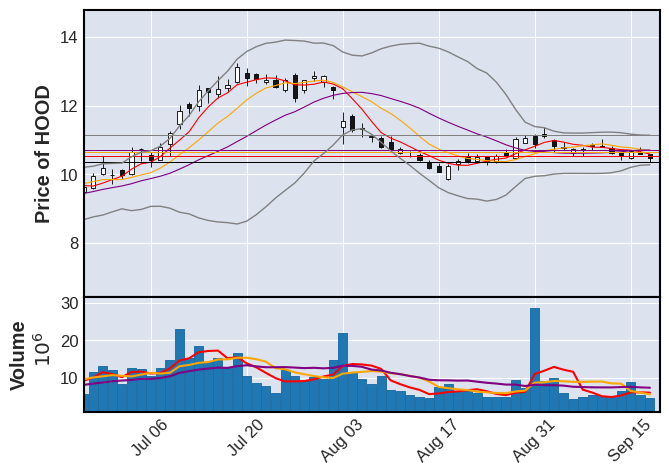

KSS, personal list only
recent amp, 1d 5d 10d 20d: [2.71 4.35 3.11 6.98]
5d ma slope, 1m 5m 10m 20m: [-1.15 -1.43 -1.66 -1.09]
H: 21.91 L: 21.33 --- O: 21.43 Mid: 21.62 C: 21.82
pred BDup gry: 27.51
pred 5 ma red: 21.93
pred 10ma org: 22.81
pred 20ma pur: 24.21
5 day min blk: 21.33


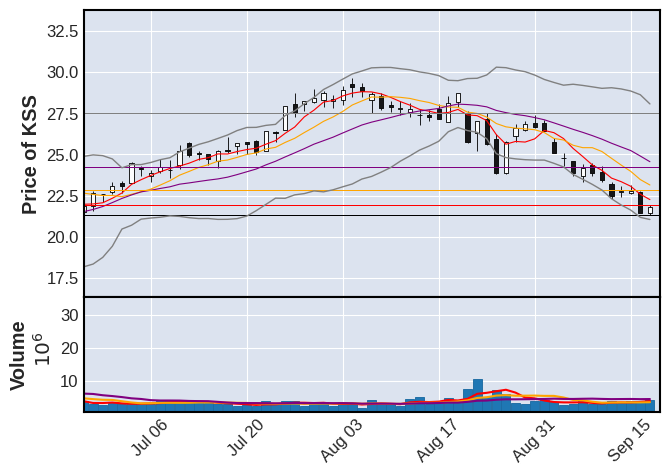

LMND, personal list only
recent amp, 1d 5d 10d 20d: [4.04 2.94 3.58 5.68]
5d ma slope, 1m 5m 10m 20m: [-0.68 -0.47 -0.86 -0.47]
H: 12.78 L: 12.27 --- O: 12.50 Mid: 12.57 C: 12.64
pred BDup gry: 14.33
pred 5 ma red: 12.71
pred 10ma org: 12.87
pred 20ma pur: 13.31
5 day min blk: 12.27


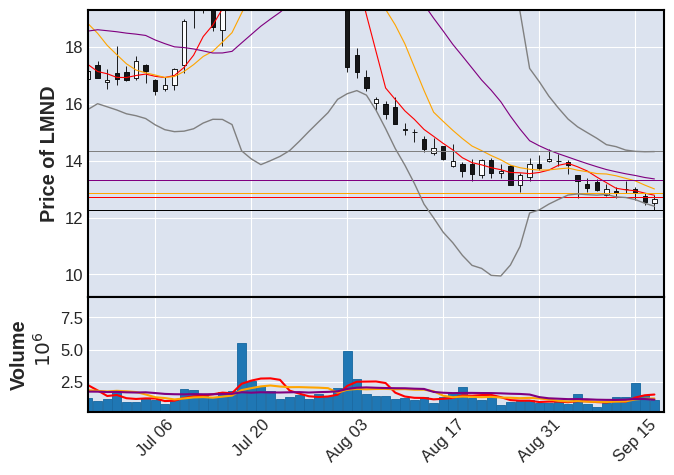

MDB, personal list only
recent amp, 1d 5d 10d 20d: [2.66 2.14 4.43 2.67]
5d ma slope, 1m 5m 10m 20m: [-1.1  -1.16 -0.69  0.08]
H: 359.51 L: 350.02 --- O: 357.17 Mid: 356.39 C: 355.61
pred BDup gry: 397.23
pred 5 ma red: 358.52
pred 10ma org: 367.90
pred 20ma pur: 371.85
5 day min blk: 350.02


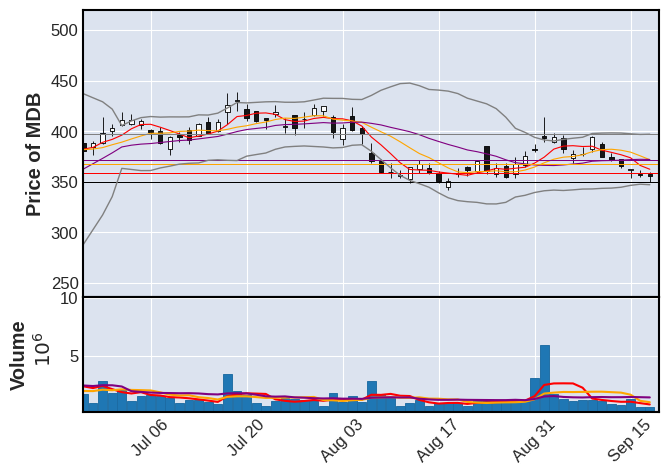

MRNA,  nas snp
recent amp, 1d 5d 10d 20d: [5.81 6.71 2.87 3.93]
5d ma slope, 1m 5m 10m 20m: [-1.14  0.52 -0.31  0.24]
H: 107.79 L: 101.85 --- O: 102.31 Mid: 104.52 C: 106.74
pred BDup gry: 118.96
pred 5 ma red: 109.67
pred 10ma org: 107.95
pred 20ma pur: 110.78
5 day min blk: 101.85


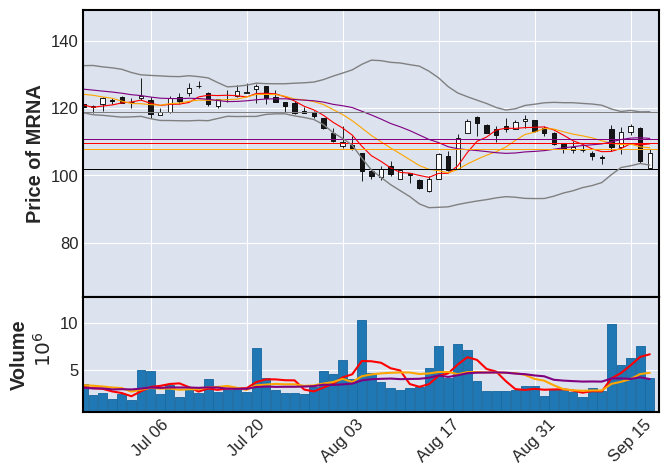

MRVL,  nas
recent amp, 1d 5d 10d 20d: [2.24 2.03 2.89 3.85]
5d ma slope, 1m 5m 10m 20m: [-0.73 -0.46 -0.55 -0.28]
H: 54.59 L: 53.37 --- O: 54.57 Mid: 54.33 C: 54.09
pred BDup gry: 59.92
pred 5 ma red: 54.65
pred 10ma org: 55.20
pred 20ma pur: 56.22
5 day min blk: 53.37


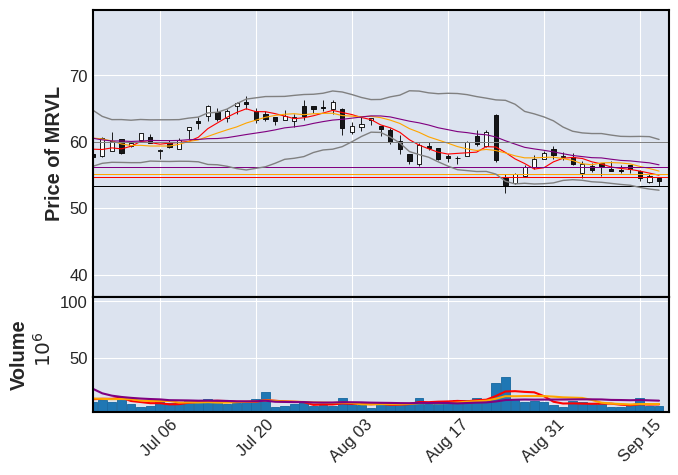

NET, personal list only
recent amp, 1d 5d 10d 20d: [2.64 2.69 3.65 3.34]
5d ma slope, 1m 5m 10m 20m: [-1.93 -0.5  -0.33  0.27]
H: 61.32 L: 59.71 --- O: 61.17 Mid: 60.67 C: 60.17
pred BDup gry: 66.58
pred 5 ma red: 62.01
pred 10ma org: 63.00
pred 20ma pur: 63.28
5 day min blk: 59.71


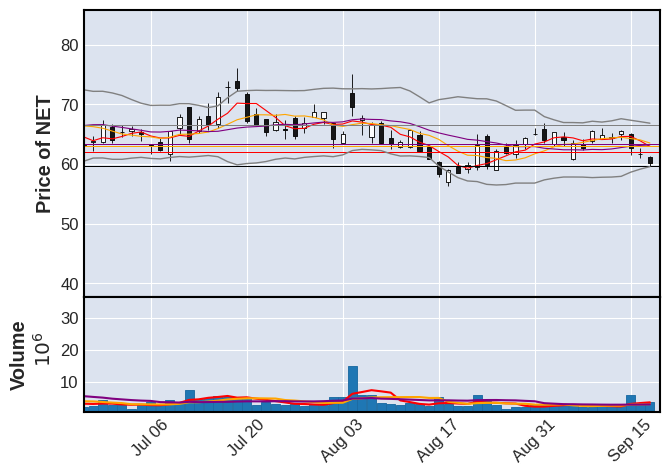

NIO, personal list only
recent amp, 1d 5d 10d 20d: [12.47  4.02  4.11  7.09]
5d ma slope, 1m 5m 10m 20m: [-3.09 -0.46 -0.64 -0.52]
H: 9.60 L: 8.41 --- O: 9.54 Mid: 9.05 C: 8.55
pred BDup gry: 11.87
pred 5 ma red: 9.54
pred 10ma org: 9.91
pred 20ma pur: 10.34
5 day min blk: 8.41


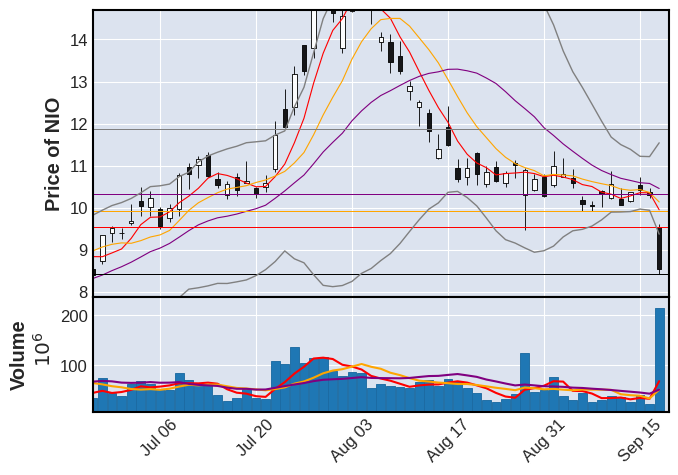

OKTA, personal list only
recent amp, 1d 5d 10d 20d: [2.18 1.58 2.2  2.84]
5d ma slope, 1m 5m 10m 20m: [-1.56 -1.01  0.09  0.76]
H: 83.60 L: 81.80 --- O: 82.57 Mid: 82.31 C: 82.04
pred BDup gry: 95.36
pred 5 ma red: 83.49
pred 10ma org: 85.81
pred 20ma pur: 81.76
5 day min blk: 81.80


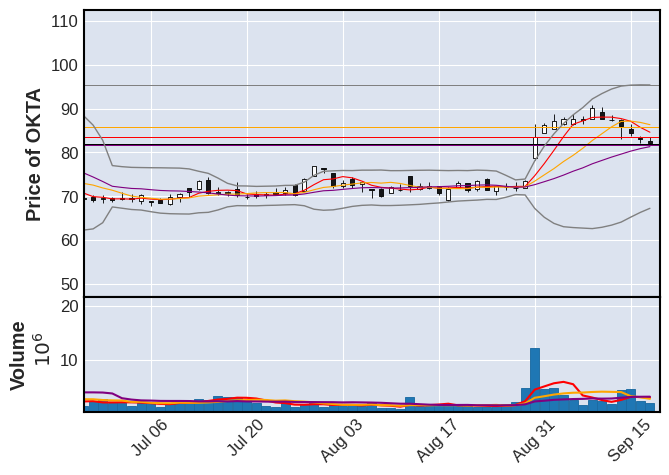

OXY,  snp
recent amp, 1d 5d 10d 20d: [2.72 1.44 2.34 1.52]
5d ma slope, 1m 5m 10m 20m: [-0.3   0.44  0.37  0.23]
H: 67.21 L: 65.38 --- O: 67.19 Mid: 66.50 C: 65.81
pred BDup gry: 68.31
pred 5 ma red: 66.26
pred 10ma org: 65.72
pred 20ma pur: 64.42
5 day min blk: 65.38


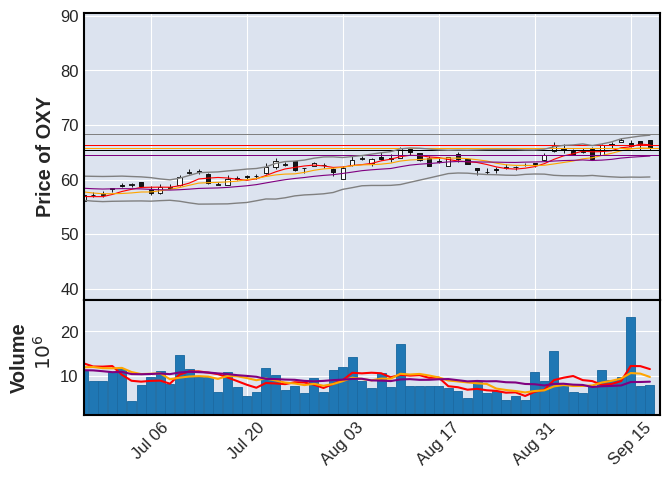

PINS, personal list only
recent amp, 1d 5d 10d 20d: [9.93 5.27 4.19 2.31]
5d ma slope, 1m 5m 10m 20m: [-0.3  -1.48 -0.72 -0.17]
H: 26.88 L: 24.38 --- O: 25.18 Mid: 25.69 C: 26.21
pred BDup gry: 28.78
pred 5 ma red: 25.60
pred 10ma org: 26.60
pred 20ma pur: 27.04
5 day min blk: 24.38


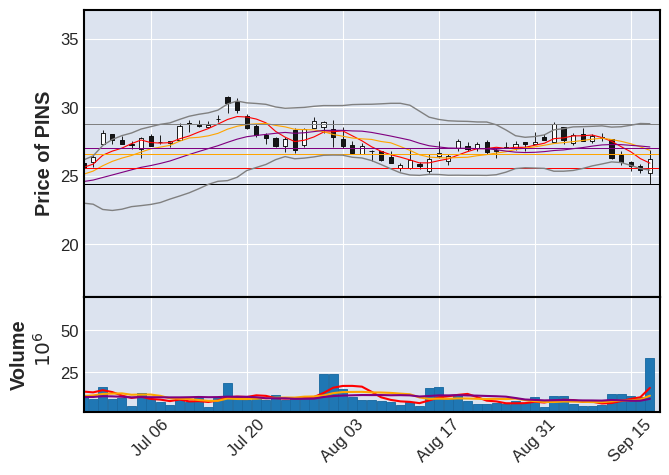

PLAY, personal list only
recent amp, 1d 5d 10d 20d: [2.71 2.66 4.83 2.37]
5d ma slope, 1m 5m 10m 20m: [ 0.78  0.88 -0.77 -0.48]
H: 37.10 L: 36.12 --- O: 36.22 Mid: 36.36 C: 36.51
pred BDup gry: 41.30
pred 5 ma red: 36.42
pred 10ma org: 35.64
pred 20ma pur: 37.40
5 day min blk: 34.84


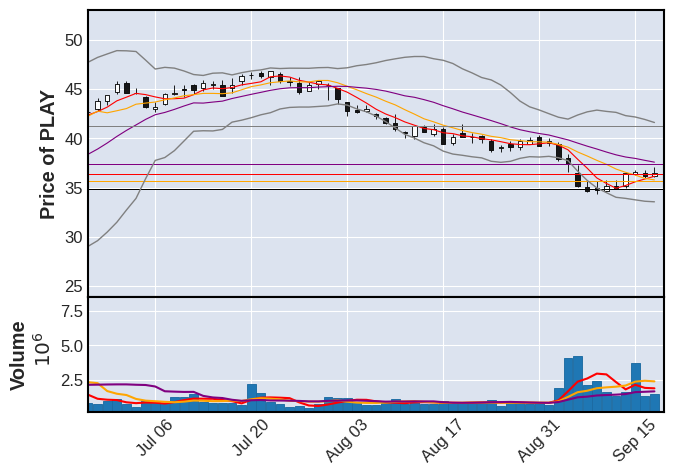

PLTR, personal list only
recent amp, 1d 5d 10d 20d: [3.71 2.75 3.56 3.39]
5d ma slope, 1m 5m 10m 20m: [-0.81 -0.    0.05  0.29]
H: 15.52 L: 14.95 --- O: 15.34 Mid: 15.24 C: 15.15
pred BDup gry: 16.21
pred 5 ma red: 15.39
pred 10ma org: 15.43
pred 20ma pur: 15.27
5 day min blk: 14.95


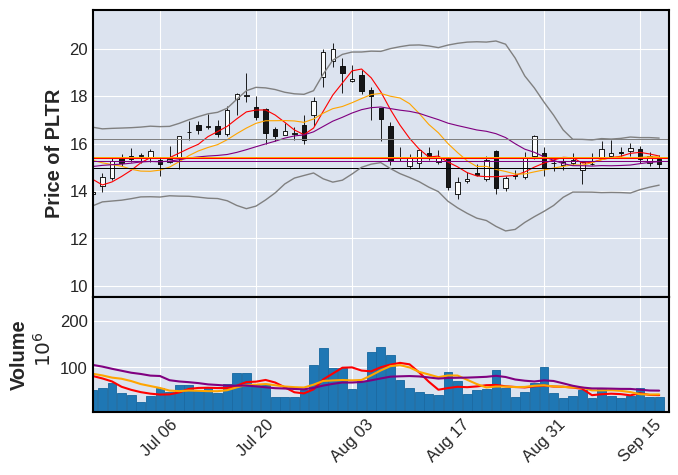

PTON, personal list only
recent amp, 1d 5d 10d 20d: [5.7  5.03 9.3  7.88]
5d ma slope, 1m 5m 10m 20m: [-2.44 -2.16 -2.63 -1.73]
H: 4.84 L: 4.57 --- O: 4.65 Mid: 4.73 C: 4.80
pred BDup gry: 6.83
pred 5 ma red: 4.84
pred 10ma org: 5.11
pred 20ma pur: 5.61
5 day min blk: 4.57
--- CAUTION --- EXTREME volatility --- CAUTION ---


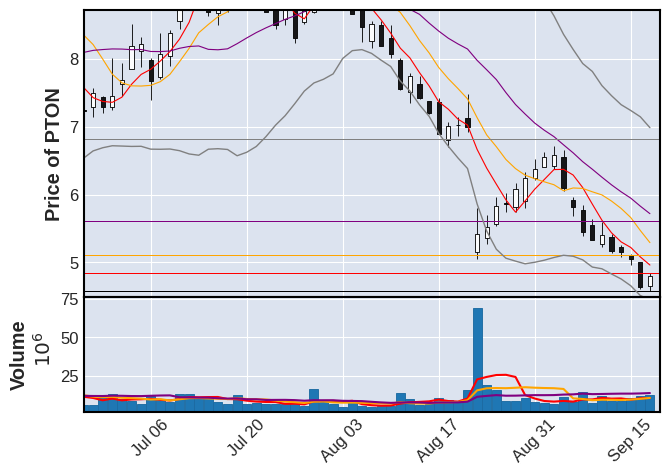

RETA, personal list only
recent amp, 1d 5d 10d 20d: [0.11 0.09 0.25 0.27]
5d ma slope, 1m 5m 10m 20m: [0.01 0.15 0.17 0.09]
H: 172.15 L: 171.96 --- O: 172.00 Mid: 172.06 C: 172.11
pred BDup gry: 173.17
pred 5 ma red: 172.07
pred 10ma org: 171.56
pred 20ma pur: 170.34
5 day min blk: 171.75


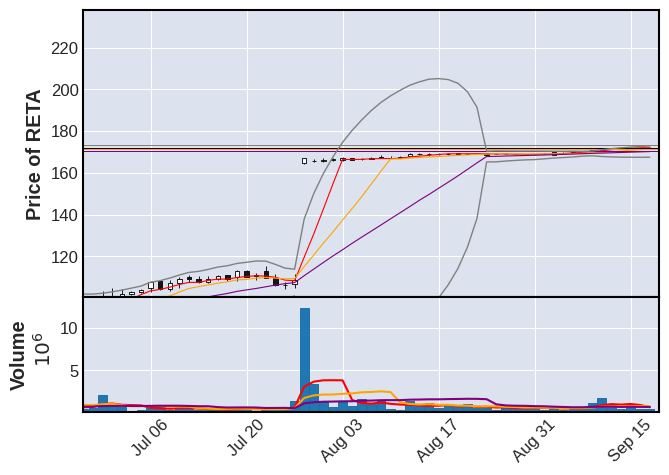

RIVN, personal list only
recent amp, 1d 5d 10d 20d: [7.23 2.35 3.95 7.95]
5d ma slope, 1m 5m 10m 20m: [-0.61  0.33  0.29  0.63]
H: 23.51 L: 21.81 --- O: 23.50 Mid: 23.12 C: 22.74
pred BDup gry: 25.48
pred 5 ma red: 23.43
pred 10ma org: 23.41
pred 20ma pur: 22.58
5 day min blk: 21.81


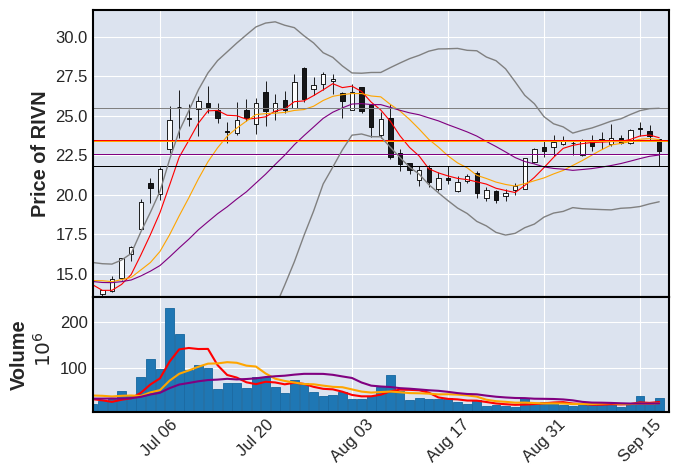

RKT, personal list only
recent amp, 1d 5d 10d 20d: [1.63 3.52 2.96 2.81]
5d ma slope, 1m 5m 10m 20m: [-1.81 -1.59 -1.1  -0.55]
H: 9.34 L: 9.19 --- O: 9.23 Mid: 9.21 C: 9.19
pred BDup gry: 11.15
pred 5 ma red: 9.34
pred 10ma org: 9.78
pred 20ma pur: 10.12
5 day min blk: 9.19


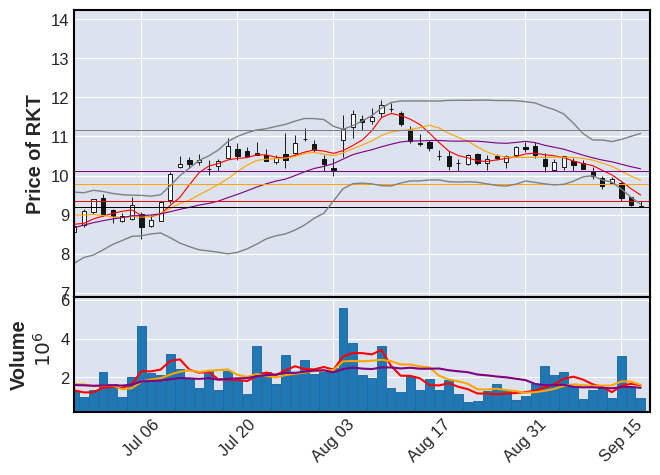

ROKU, personal list only
recent amp, 1d 5d 10d 20d: [ 3.63  4.28 13.19  4.04]
5d ma slope, 1m 5m 10m 20m: [-1.62 -1.89 -0.76 -0.2 ]
H: 74.65 L: 71.96 --- O: 74.09 Mid: 73.95 C: 73.81
pred BDup gry: 87.09
pred 5 ma red: 74.64
pred 10ma org: 78.96
pred 20ma pur: 79.59
5 day min blk: 71.96


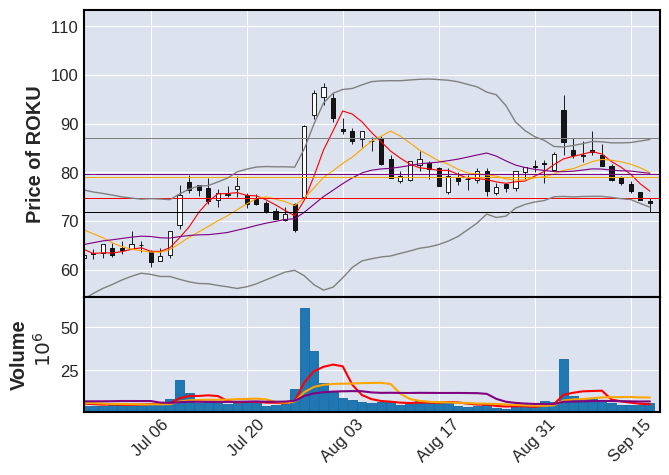

SNAP, personal list only
recent amp, 1d 5d 10d 20d: [4.37 2.72 7.01 2.98]
5d ma slope, 1m 5m 10m 20m: [-0.91 -0.97 -1.33 -0.06]
H: 9.01 L: 8.62 --- O: 8.82 Mid: 8.91 C: 9.00
pred BDup gry: 10.51
pred 5 ma red: 8.98
pred 10ma org: 9.18
pred 20ma pur: 9.54
5 day min blk: 8.62


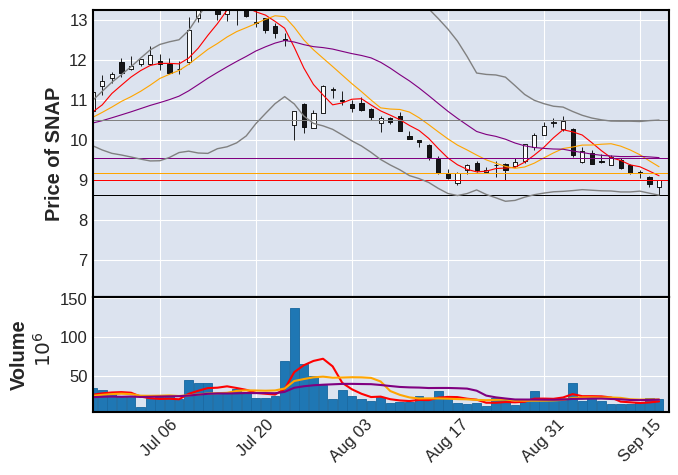

SNOW, personal list only
recent amp, 1d 5d 10d 20d: [3.03 2.46 1.93 1.72]
5d ma slope, 1m 5m 10m 20m: [-0.77 -0.54  0.28  0.42]
H: 161.85 L: 156.96 --- O: 161.14 Mid: 160.44 C: 159.74
pred BDup gry: 170.66
pred 5 ma red: 160.97
pred 10ma org: 163.26
pred 20ma pur: 158.96
5 day min blk: 156.96


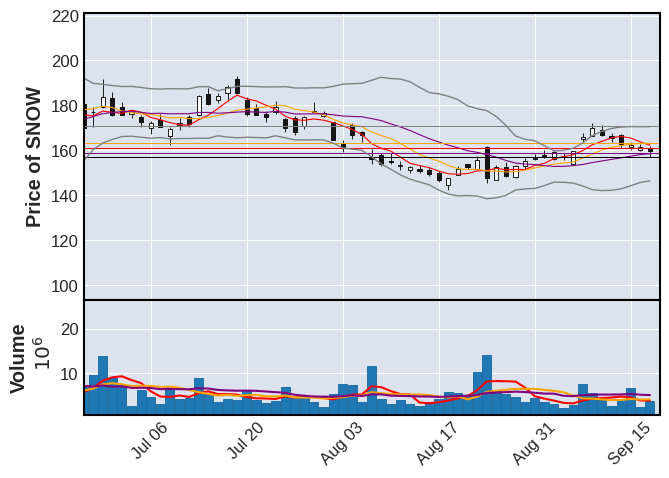

SOFI, personal list only
recent amp, 1d 5d 10d 20d: [3.82 3.56 4.35 4.29]
5d ma slope, 1m 5m 10m 20m: [-0.84  0.24  0.14  0.38]
H: 8.87 L: 8.54 --- O: 8.65 Mid: 8.63 C: 8.62
pred BDup gry: 9.18
pred 5 ma red: 8.77
pred 10ma org: 8.76
pred 20ma pur: 8.64
5 day min blk: 8.54


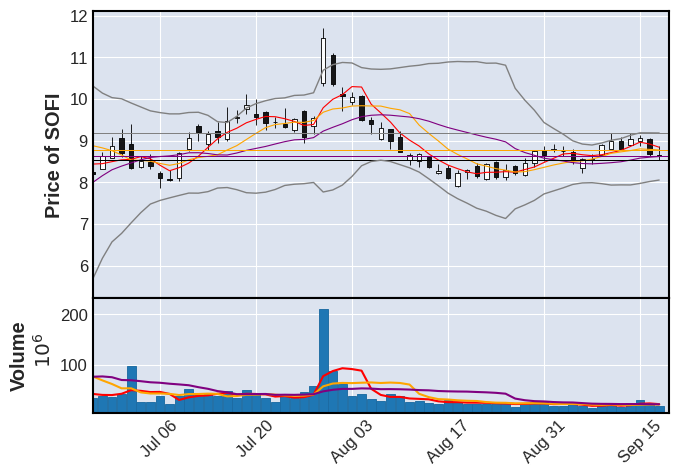

SPCE, personal list only
recent amp, 1d 5d 10d 20d: [7.93 9.36 5.25 9.23]
5d ma slope, 1m 5m 10m 20m: [ 0.42 -1.94 -2.54 -1.6 ]
H: 2.02 L: 1.87 --- O: 1.88 Mid: 1.94 C: 2.01
pred BDup gry: 2.92
pred 5 ma red: 1.96
pred 10ma org: 2.05
pred 20ma pur: 2.32
5 day min blk: 1.83
--- CAUTION --- EXTREME volatility --- CAUTION ---


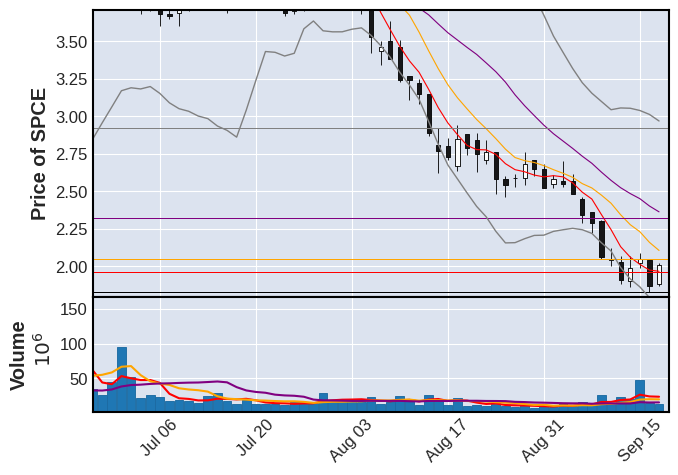

TTD,  nas
recent amp, 1d 5d 10d 20d: [2.87 2.41 2.47 2.05]
5d ma slope, 1m 5m 10m 20m: [-2.02 -0.71  0.21  0.63]
H: 80.96 L: 78.65 --- O: 80.46 Mid: 79.76 C: 79.06
pred BDup gry: 88.10
pred 5 ma red: 81.42
pred 10ma org: 83.55
pred 20ma pur: 81.15
5 day min blk: 78.65


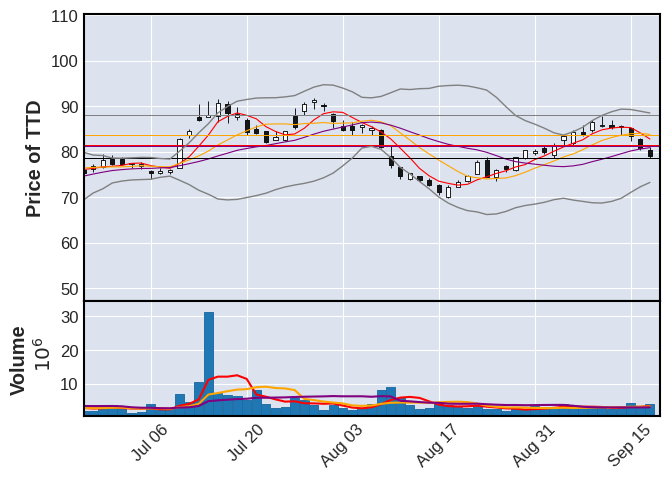

U, personal list only
recent amp, 1d 5d 10d 20d: [4.08 7.57 4.58 4.06]
5d ma slope, 1m 5m 10m 20m: [-2.17 -1.71 -0.68  0.08]
H: 34.48 L: 33.12 --- O: 33.37 Mid: 33.66 C: 33.96
pred BDup gry: 40.11
pred 5 ma red: 34.25
pred 10ma org: 36.36
pred 20ma pur: 36.34
5 day min blk: 32.46


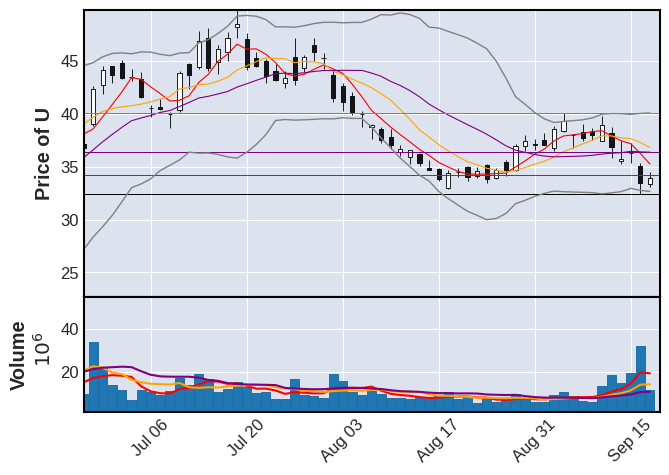

UPST, personal list only
recent amp, 1d 5d 10d 20d: [ 4.53  5.78 10.15  7.09]
5d ma slope, 1m 5m 10m 20m: [-1.51 -1.01 -1.13 -0.48]
H: 29.15 L: 27.85 --- O: 28.70 Mid: 28.62 C: 28.53
pred BDup gry: 34.05
pred 5 ma red: 28.92
pred 10ma org: 29.89
pred 20ma pur: 30.89
5 day min blk: 27.85
--- CAUTION --- EXTREME volatility --- CAUTION ---


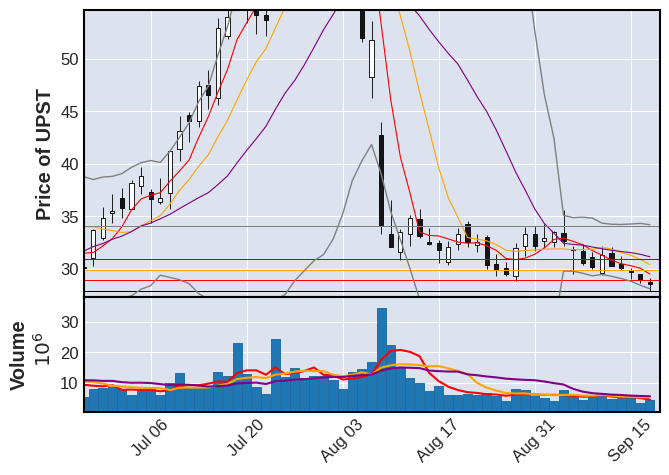

WOLF, personal list only
recent amp, 1d 5d 10d 20d: [3.45 4.48 5.09 3.24]
5d ma slope, 1m 5m 10m 20m: [-2.29 -0.16 -0.97 -0.34]
H: 41.48 L: 40.08 --- O: 40.53 Mid: 40.75 C: 40.97
pred BDup gry: 49.43
pred 5 ma red: 42.17
pred 10ma org: 42.48
pred 20ma pur: 44.54
5 day min blk: 40.08


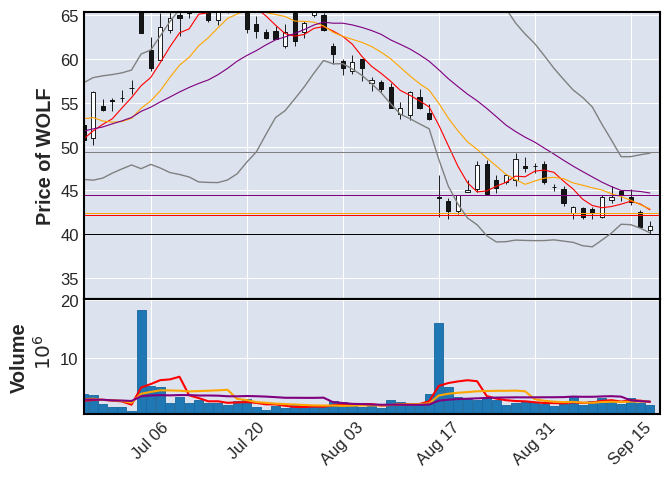

WWE, personal list only
recent amp, 1d 5d 10d 20d: [3.89 6.68 2.55 1.41]
5d ma slope, 1m 5m 10m 20m: [-0.08 -1.25 -1.37 -0.51]
H: 101.94 L: 98.07 --- O: 99.51 Mid: 100.08 C: 100.65
pred BDup gry: 122.21
pred 5 ma red: 98.85
pred 10ma org: 102.76
pred 20ma pur: 108.02
5 day min blk: 96.11


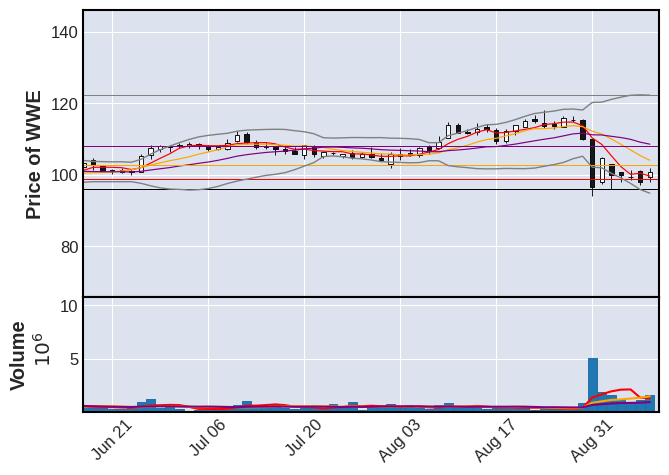

ZM,  nas
recent amp, 1d 5d 10d 20d: [2.72 2.2  2.03 5.63]
5d ma slope, 1m 5m 10m 20m: [-0.28 -0.35 -0.07  0.34]
H: 70.55 L: 68.64 --- O: 70.12 Mid: 69.73 C: 69.34
pred BDup gry: 74.72
pred 5 ma red: 70.31
pred 10ma org: 71.03
pred 20ma pur: 70.30
5 day min blk: 68.64


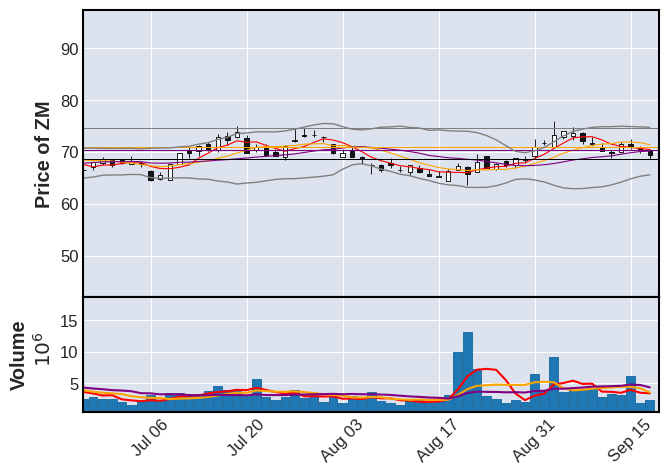

In [ ]:
# For demo purpuse, only show 5
display_full_analysis(meme, full_data, metadata_dict, volatility="high")

## focus

AMZN,  nas snp
recent amp, 1d 5d 10d 20d: [2.36 2.92 2.08 1.42]
5d ma slope, 1m 5m 10m 20m: [-1.32  0.05  0.24  0.24]
H: 138.84 L: 135.56 --- O: 138.70 Mid: 138.17 C: 137.63
pred BDup gry: 145.26
pred 5 ma red: 140.79
pred 10ma org: 140.37
pred 20ma pur: 137.88
5 day min blk: 135.56


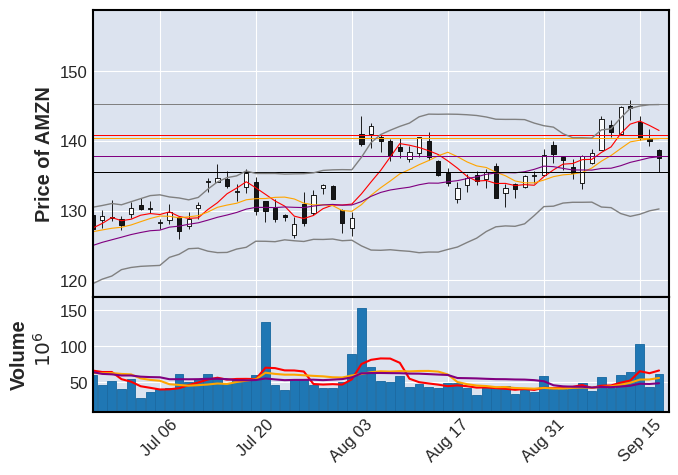

TSLA,  nas snp
recent amp, 1d 5d 10d 20d: [2.52 2.55 4.05 4.69]
5d ma slope, 1m 5m 10m 20m: [-0.75  0.76  0.65  0.99]
H: 267.85 L: 261.20 --- O: 264.35 Mid: 265.43 C: 266.50
pred BDup gry: 284.25
pred 5 ma red: 270.51
pred 10ma org: 265.65
pred 20ma pur: 256.64
5 day min blk: 261.20


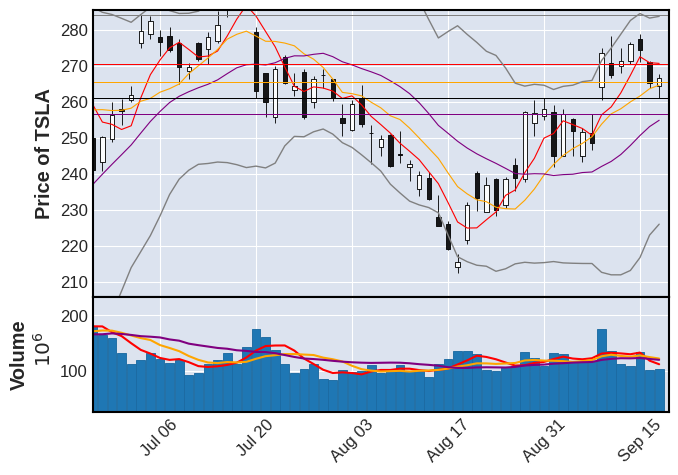

AAPL,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.41 1.88 3.92 0.81]
5d ma slope, 1m 5m 10m 20m: [ 0.69 -0.13 -0.65  0.05]
H: 179.63 L: 177.13 --- O: 177.52 Mid: 178.30 C: 179.07
pred BDup gry: 190.18
pred 5 ma red: 176.95
pred 10ma org: 176.57
pred 20ma pur: 180.59
5 day min blk: 173.58


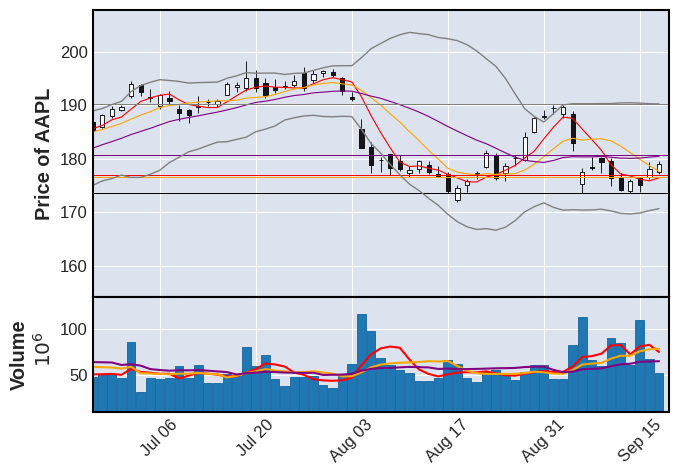

ADBE,  nas snp
recent amp, 1d 5d 10d 20d: [2.43 2.41 1.46 2.2 ]
5d ma slope, 1m 5m 10m 20m: [-0.79 -0.75 -0.39  0.22]
H: 542.40 L: 529.47 --- O: 531.35 Mid: 536.52 C: 541.69
pred BDup gry: 576.88
pred 5 ma red: 541.64
pred 10ma org: 547.50
pred 20ma pur: 545.52
5 day min blk: 522.18


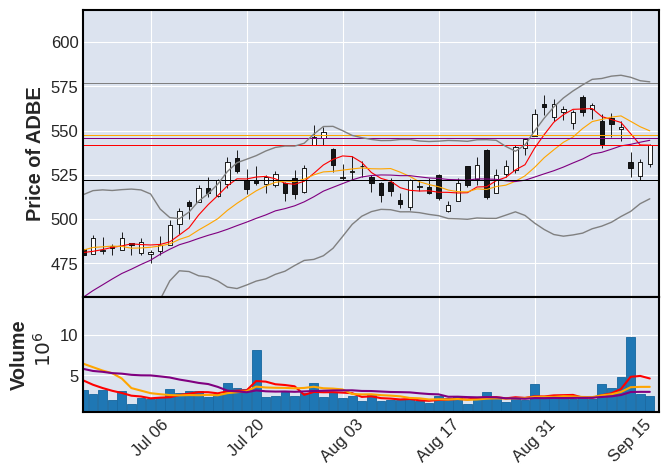

AMAT,  nas snp
recent amp, 1d 5d 10d 20d: [2.42 2.3  2.42 2.79]
5d ma slope, 1m 5m 10m 20m: [-1.25 -0.92 -0.86 -0.05]
H: 140.05 L: 136.67 --- O: 139.71 Mid: 138.71 C: 137.71
pred BDup gry: 156.84
pred 5 ma red: 139.82
pred 10ma org: 142.91
pred 20ma pur: 146.17
5 day min blk: 136.67


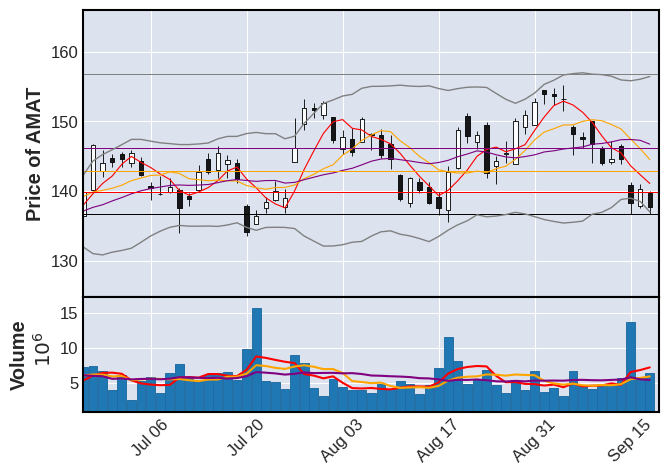

AMD,  nas snp
recent amp, 1d 5d 10d 20d: [2.12 3.72 2.81 4.45]
5d ma slope, 1m 5m 10m 20m: [-1.53 -0.56 -0.49 -0.15]
H: 102.86 L: 100.70 --- O: 101.75 Mid: 101.68 C: 101.61
pred BDup gry: 111.24
pred 5 ma red: 103.22
pred 10ma org: 104.32
pred 20ma pur: 105.30
5 day min blk: 99.45


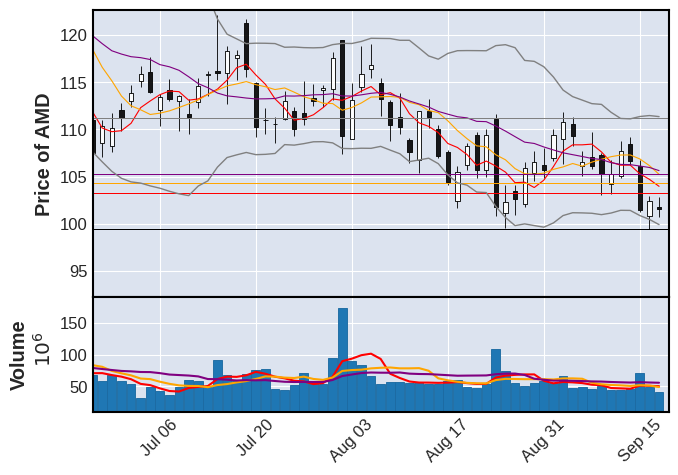

BABA, personal list only
recent amp, 1d 5d 10d 20d: [2.09 1.03 1.77 1.83]
5d ma slope, 1m 5m 10m 20m: [-0.23 -0.46 -0.74 -0.1 ]
H: 87.88 L: 86.08 --- O: 86.12 Mid: 86.62 C: 87.11
pred BDup gry: 96.09
pred 5 ma red: 87.13
pred 10ma org: 88.08
pred 20ma pur: 90.31
5 day min blk: 85.39


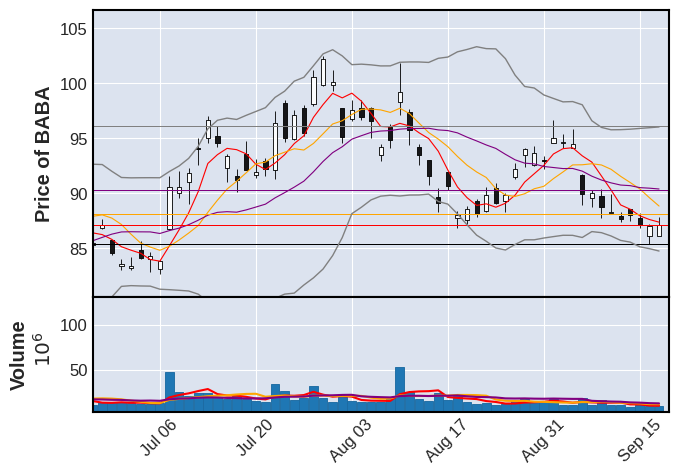

BAC,  snp
recent amp, 1d 5d 10d 20d: [1.5  1.68 1.55 2.81]
5d ma slope, 1m 5m 10m 20m: [-0.31  0.26  0.01 -0.06]
H: 28.94 L: 28.51 --- O: 28.76 Mid: 28.70 C: 28.65
pred BDup gry: 29.21
pred 5 ma red: 28.80
pred 10ma org: 28.67
pred 20ma pur: 28.67
5 day min blk: 28.49


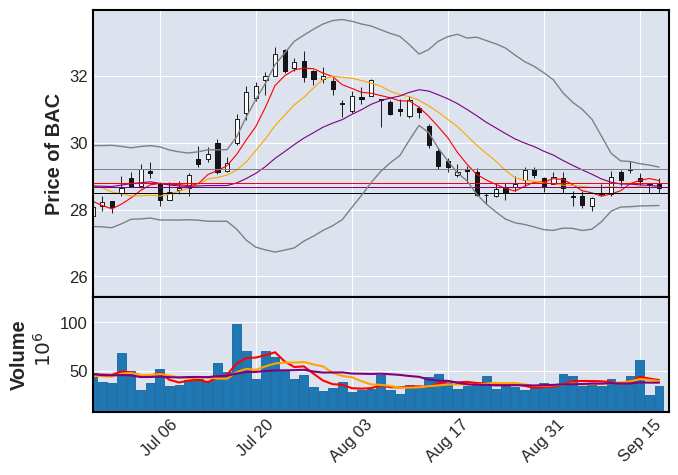

CRM,  dow snp
recent amp, 1d 5d 10d 20d: [1.77 1.61 1.45 1.96]
5d ma slope, 1m 5m 10m 20m: [-0.46 -0.73 -0.17  0.23]
H: 216.06 L: 212.26 --- O: 214.39 Mid: 215.04 C: 215.70
pred BDup gry: 228.27
pred 5 ma red: 215.39
pred 10ma org: 219.58
pred 20ma pur: 216.84
5 day min blk: 212.26


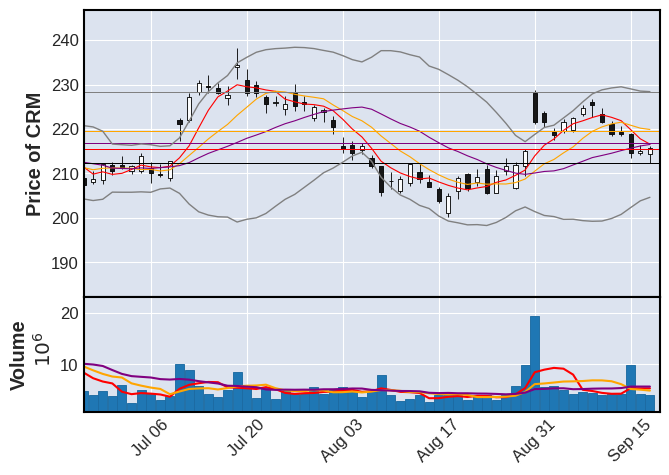

CSCO,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.33 0.8  0.7  0.97]
5d ma slope, 1m 5m 10m 20m: [-0.2  -0.21 -0.23  0.13]
H: 56.21 L: 55.46 --- O: 56.18 Mid: 56.01 C: 55.84
pred BDup gry: 57.74
pred 5 ma red: 56.02
pred 10ma org: 56.31
pred 20ma pur: 56.46
5 day min blk: 55.46


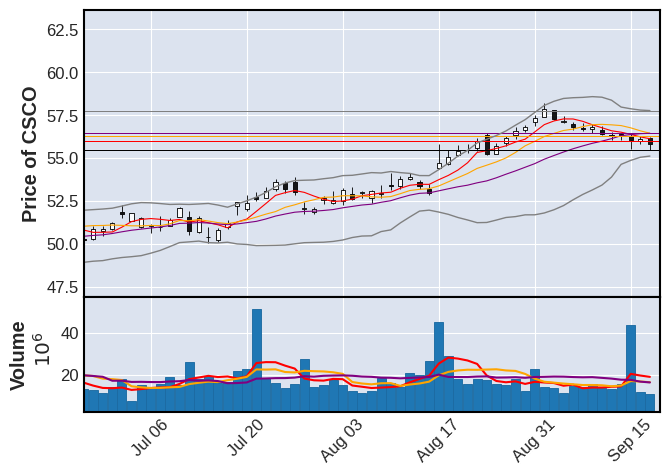

DELL, personal list only
recent amp, 1d 5d 10d 20d: [1.62 2.03 3.9  1.79]
5d ma slope, 1m 5m 10m 20m: [-0.44 -0.28  1.14  1.18]
H: 70.41 L: 69.28 --- O: 69.81 Mid: 69.85 C: 69.90
pred BDup gry: 78.69
pred 5 ma red: 69.82
pred 10ma org: 70.46
pred 20ma pur: 65.21
5 day min blk: 68.40


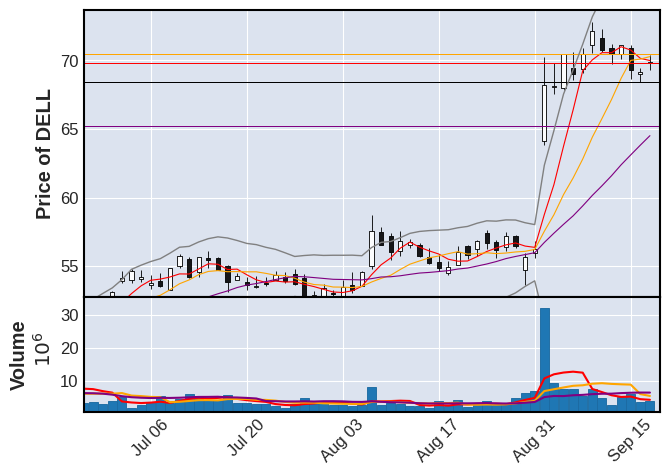

GOOG,  nas snp
recent amp, 1d 5d 10d 20d: [1.21 2.04 2.04 1.57]
5d ma slope, 1m 5m 10m 20m: [0.19 0.26 0.13 0.36]
H: 139.18 L: 137.50 --- O: 138.25 Mid: 138.54 C: 138.83
pred BDup gry: 141.57
pred 5 ma red: 139.07
pred 10ma org: 137.73
pred 20ma pur: 136.21
5 day min blk: 134.93


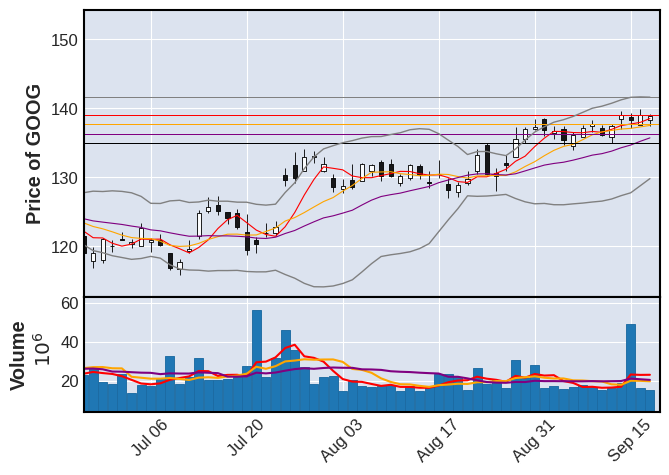

IBM,  dow snp
recent amp, 1d 5d 10d 20d: [1.42 0.73 0.82 1.35]
5d ma slope, 1m 5m 10m 20m: [-0.16 -0.2  -0.09  0.17]
H: 146.72 L: 144.66 --- O: 145.00 Mid: 145.76 C: 146.52
pred BDup gry: 149.63
pred 5 ma red: 146.34
pred 10ma org: 146.78
pred 20ma pur: 146.49
5 day min blk: 144.66


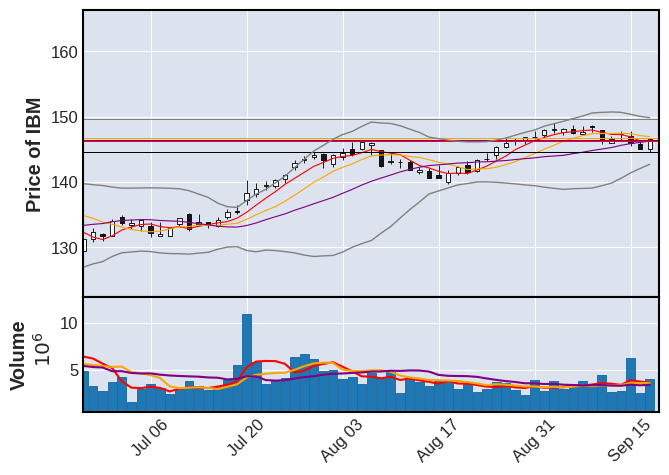

INTC,  dow nas snp
recent amp, 1d 5d 10d 20d: [5.47 2.32 2.76 2.92]
5d ma slope, 1m 5m 10m 20m: [-1.4  -0.32  0.53  0.69]
H: 38.10 L: 36.02 --- O: 38.04 Mid: 37.19 C: 36.34
pred BDup gry: 40.53
pred 5 ma red: 37.41
pred 10ma org: 37.98
pred 20ma pur: 36.35
5 day min blk: 36.02


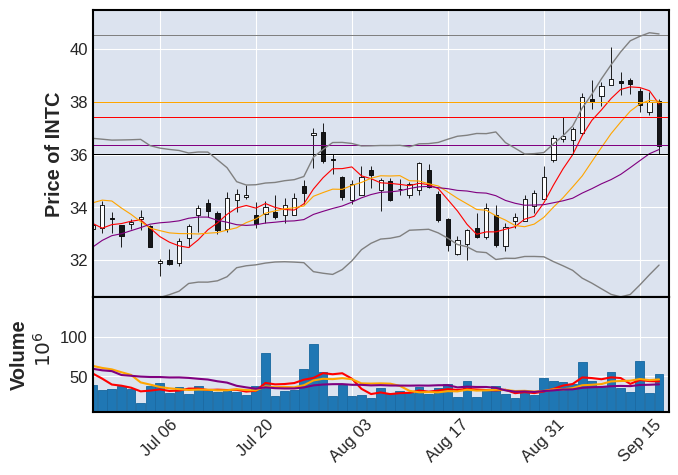

LRCX,  nas snp
recent amp, 1d 5d 10d 20d: [2.36 2.17 2.97 2.42]
5d ma slope, 1m 5m 10m 20m: [-1.33 -0.95 -0.95 -0.15]
H: 636.76 L: 621.73 --- O: 635.65 Mid: 630.40 C: 625.15
pred BDup gry: 717.59
pred 5 ma red: 634.29
pred 10ma org: 648.16
pred 20ma pur: 665.84
5 day min blk: 617.77


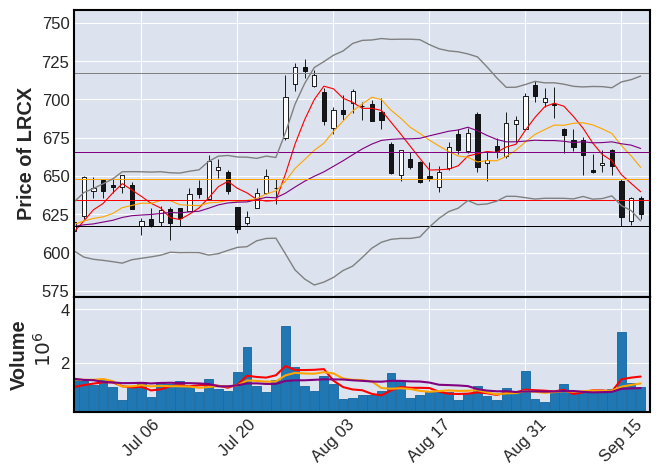

LSCC, personal list only
recent amp, 1d 5d 10d 20d: [1.91 3.27 3.28 2.75]
5d ma slope, 1m 5m 10m 20m: [-1.42 -0.62 -0.9   0.01]
H: 86.72 L: 85.07 --- O: 86.50 Mid: 86.33 C: 86.16
pred BDup gry: 98.93
pred 5 ma red: 87.93
pred 10ma org: 89.19
pred 20ma pur: 91.54
5 day min blk: 85.07


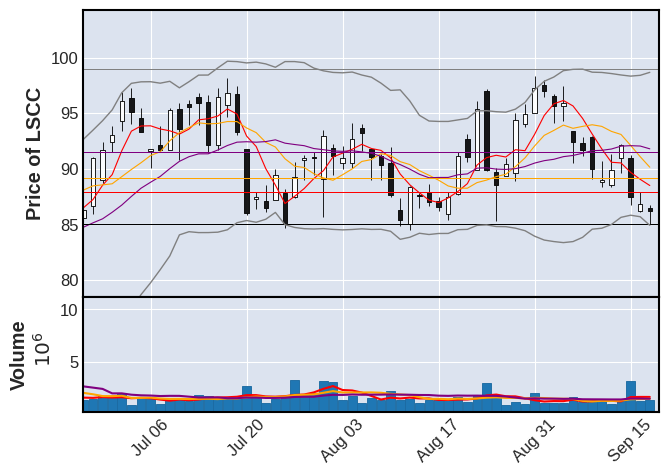

META,  nas snp
recent amp, 1d 5d 10d 20d: [2.1  1.94 2.53 2.1 ]
5d ma slope, 1m 5m 10m 20m: [-0.3   0.17  0.25  0.29]
H: 306.17 L: 299.81 --- O: 302.48 Mid: 303.78 C: 305.07
pred BDup gry: 312.52
pred 5 ma red: 305.62
pred 10ma org: 303.46
pred 20ma pur: 298.73
5 day min blk: 297.80


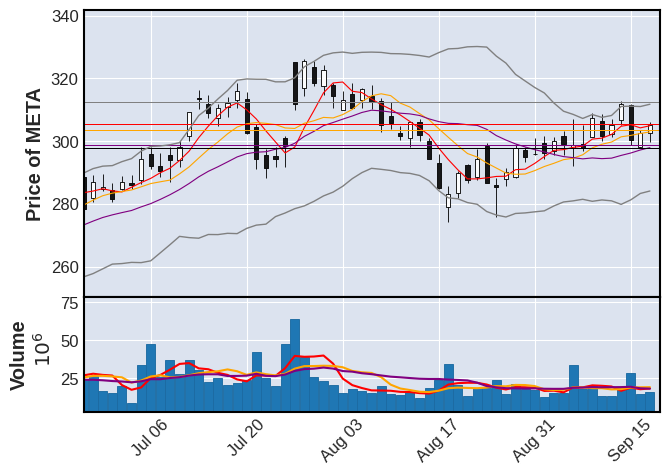

MSFT,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.5  1.71 1.28 1.42]
5d ma slope, 1m 5m 10m 20m: [-0.73 -0.16  0.06  0.2 ]
H: 329.39 L: 324.51 --- O: 326.17 Mid: 327.41 C: 328.65
pred BDup gry: 339.49
pred 5 ma red: 331.91
pred 10ma org: 332.46
pred 20ma pur: 329.98
5 day min blk: 324.51


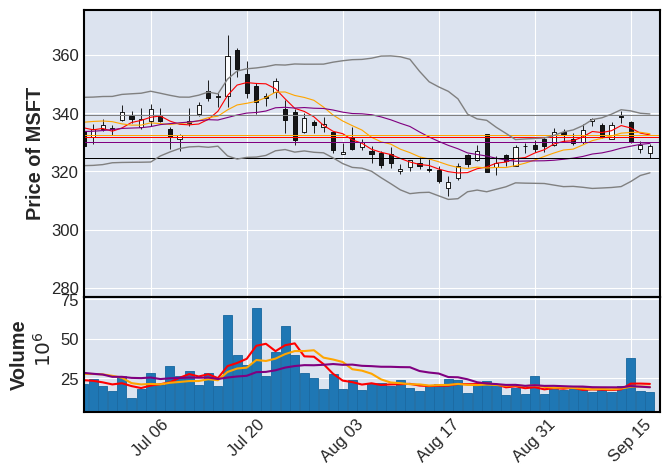

MU,  nas snp
recent amp, 1d 5d 10d 20d: [1.54 2.11 1.45 2.78]
5d ma slope, 1m 5m 10m 20m: [-0.22  0.15  0.12  0.51]
H: 71.06 L: 69.97 --- O: 70.62 Mid: 70.67 C: 70.71
pred BDup gry: 74.19
pred 5 ma red: 70.83
pred 10ma org: 70.49
pred 20ma pur: 68.90
5 day min blk: 69.64


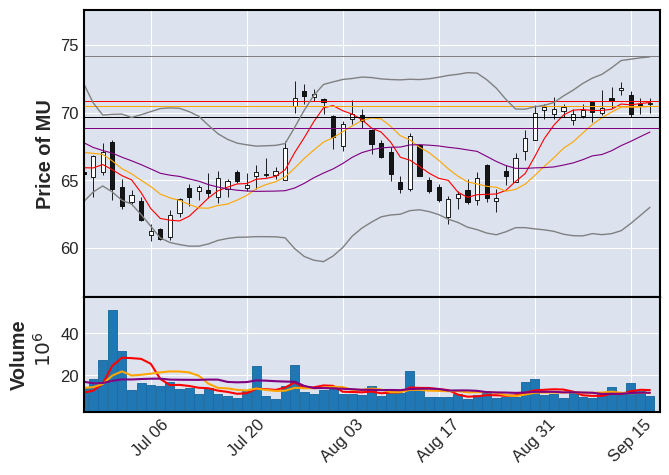

NFLX,  nas snp
recent amp, 1d 5d 10d 20d: [2.03 6.36 2.43 2.04]
5d ma slope, 1m 5m 10m 20m: [-0.93 -2.08 -0.96 -0.12]
H: 398.23 L: 390.25 --- O: 392.84 Mid: 394.52 C: 396.20
pred BDup gry: 461.87
pred 5 ma red: 392.36
pred 10ma org: 415.95
pred 20ma pur: 423.43
5 day min blk: 390.25


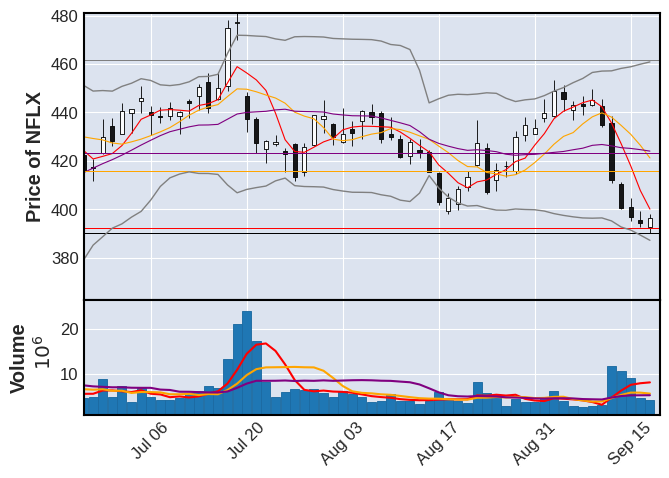

NVDA,  nas snp
recent amp, 1d 5d 10d 20d: [2.2  3.2  4.06 5.93]
5d ma slope, 1m 5m 10m 20m: [-1.22 -0.56 -1.01  0.01]
H: 439.66 L: 430.02 --- O: 438.33 Mid: 436.76 C: 435.20
pred BDup gry: 501.00
pred 5 ma red: 442.20
pred 10ma org: 446.35
pred 20ma pur: 462.59
5 day min blk: 420.00


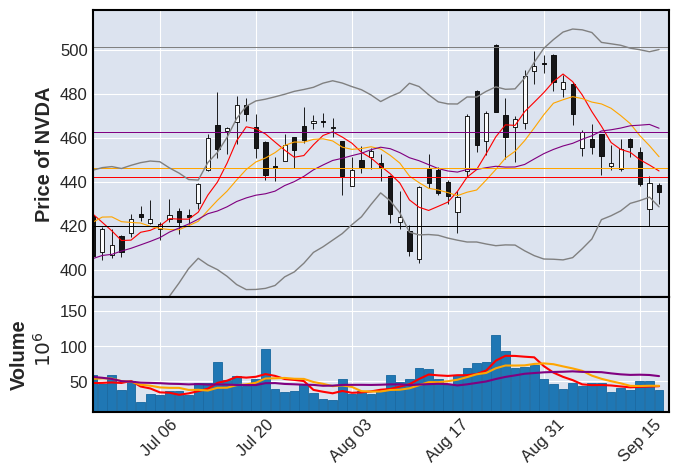

ON,  nas snp
recent amp, 1d 5d 10d 20d: [2.05 2.26 3.59 3.2 ]
5d ma slope, 1m 5m 10m 20m: [-0.73 -0.68 -0.46  0.17]
H: 94.87 L: 92.93 --- O: 94.53 Mid: 94.38 C: 94.24
pred BDup gry: 101.76
pred 5 ma red: 94.54
pred 10ma org: 96.07
pred 20ma pur: 96.09
5 day min blk: 92.00


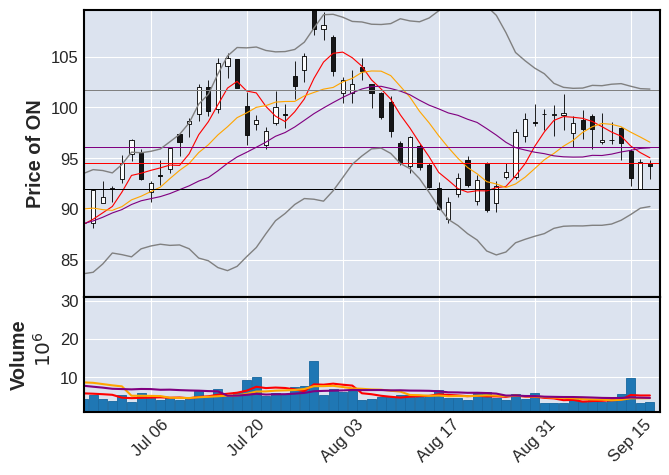

ORCL,  snp
recent amp, 1d 5d 10d 20d: [1.8  4.38 1.5  1.66]
5d ma slope, 1m 5m 10m 20m: [ 0.04 -1.62 -0.69 -0.11]
H: 113.74 L: 111.71 --- O: 112.48 Mid: 112.62 C: 112.77
pred BDup gry: 128.93
pred 5 ma red: 113.51
pred 10ma org: 116.52
pred 20ma pur: 117.99
5 day min blk: 108.20


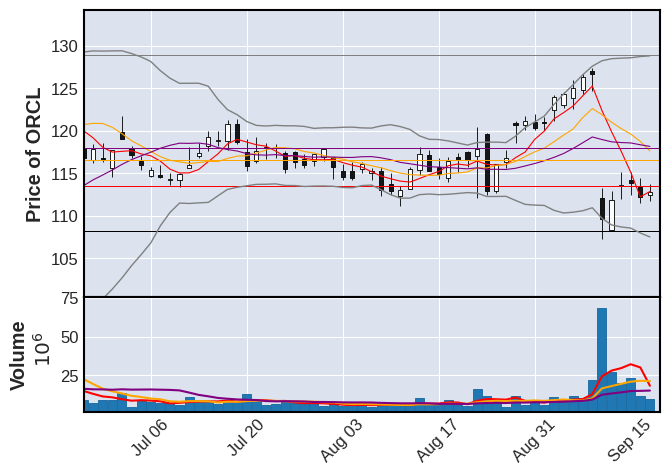

PI, personal list only
recent amp, 1d 5d 10d 20d: [2.63 2.3  3.54 2.1 ]
5d ma slope, 1m 5m 10m 20m: [-0.98 -0.13 -0.53  0.39]
H: 62.60 L: 60.99 --- O: 61.31 Mid: 61.73 C: 62.14
pred BDup gry: 69.03
pred 5 ma red: 62.99
pred 10ma org: 63.54
pred 20ma pur: 63.92
5 day min blk: 60.99


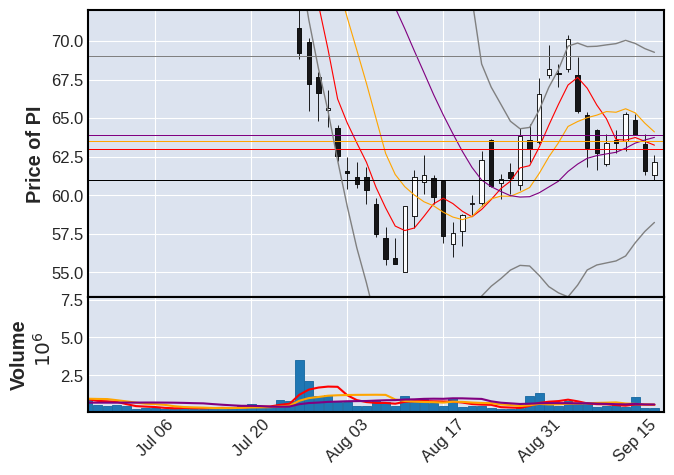

PYPL,  nas snp
recent amp, 1d 5d 10d 20d: [1.56 1.84 1.84 2.85]
5d ma slope, 1m 5m 10m 20m: [-0.45  0.55  0.03  0.34]
H: 62.42 L: 61.45 --- O: 62.10 Mid: 62.14 C: 62.19
pred BDup gry: 64.39
pred 5 ma red: 63.20
pred 10ma org: 62.52
pred 20ma pur: 62.58
5 day min blk: 61.45


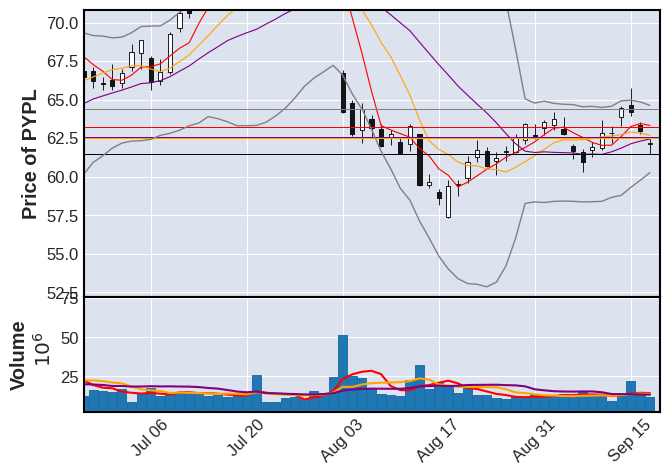

QCOM,  nas snp
recent amp, 1d 5d 10d 20d: [2.17 1.86 2.66 2.42]
5d ma slope, 1m 5m 10m 20m: [-0.46  0.78 -0.2   0.11]
H: 112.34 L: 109.91 --- O: 112.20 Mid: 111.46 C: 110.72
pred BDup gry: 117.45
pred 5 ma red: 112.56
pred 10ma org: 110.62
pred 20ma pur: 111.84
5 day min blk: 109.91


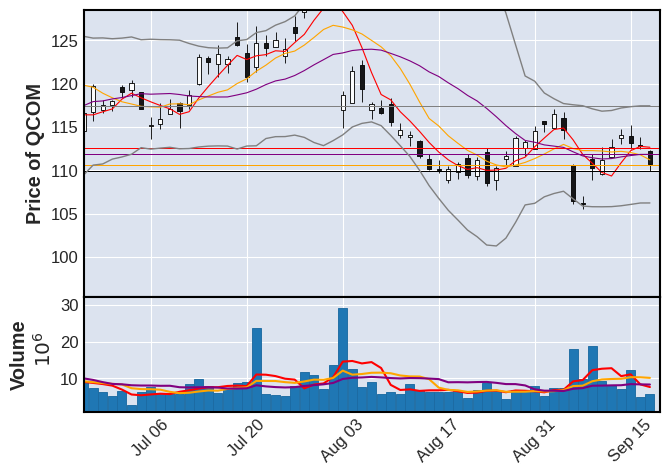

RBLX, personal list only
recent amp, 1d 5d 10d 20d: [5.33 4.84 3.39 1.97]
5d ma slope, 1m 5m 10m 20m: [-0.61 -0.89 -0.31 -0.04]
H: 27.59 L: 26.12 --- O: 27.59 Mid: 27.27 C: 26.96
pred BDup gry: 29.74
pred 5 ma red: 27.14
pred 10ma org: 28.04
pred 20ma pur: 27.90
5 day min blk: 26.12
--- CAUTION --- EXTREME volatility --- CAUTION ---


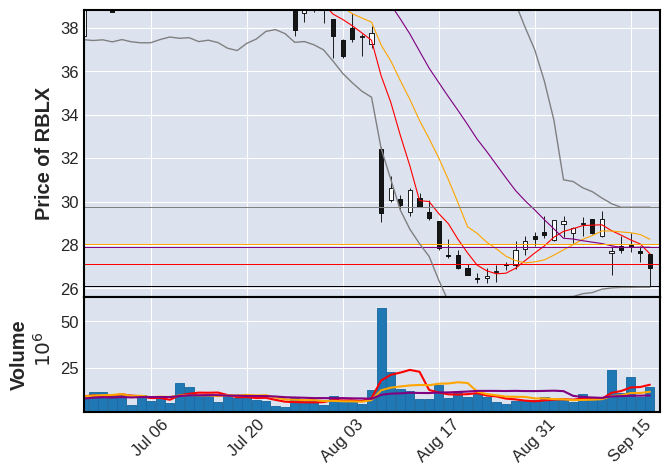

SMCI, personal list only
recent amp, 1d 5d 10d 20d: [2.62 4.11 4.22 3.8 ]
5d ma slope, 1m 5m 10m 20m: [-2.69 -1.66 -0.91  0.08]
H: 250.59 L: 244.08 --- O: 248.50 Mid: 248.12 C: 247.74
pred BDup gry: 290.04
pred 5 ma red: 252.62
pred 10ma org: 261.77
pred 20ma pur: 265.98
5 day min blk: 239.12
--- CAUTION --- EXTREME volatility --- CAUTION ---


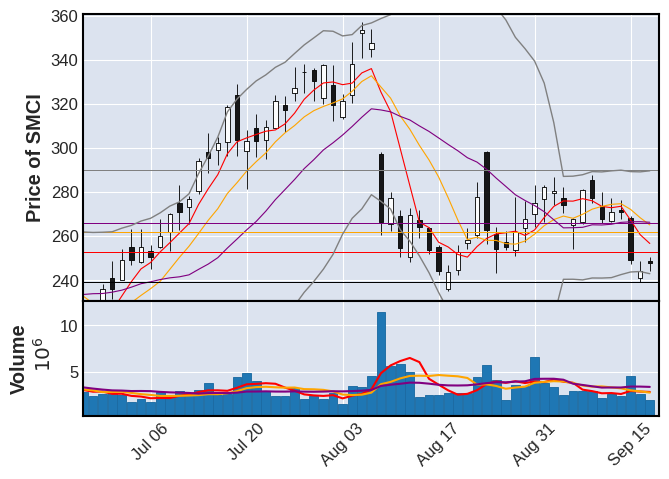

STM, personal list only
recent amp, 1d 5d 10d 20d: [1.29 1.2  2.45 2.07]
5d ma slope, 1m 5m 10m 20m: [-0.72 -0.22 -0.75 -0.27]
H: 43.47 L: 42.91 --- O: 43.31 Mid: 43.33 C: 43.34
pred BDup gry: 48.67
pred 5 ma red: 43.78
pred 10ma org: 43.92
pred 20ma pur: 45.41
5 day min blk: 42.90


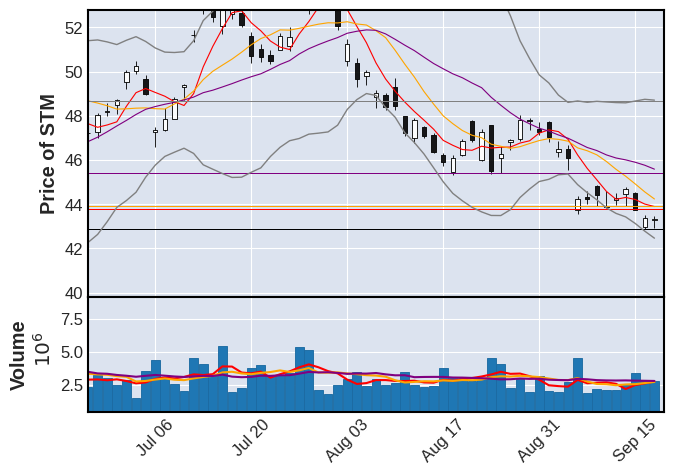

TSM, personal list only
recent amp, 1d 5d 10d 20d: [1.19 1.56 2.53 1.8 ]
5d ma slope, 1m 5m 10m 20m: [-0.96 -0.12 -0.5  -0.13]
H: 88.84 L: 87.79 --- O: 88.45 Mid: 88.31 C: 88.17
pred BDup gry: 96.39
pred 5 ma red: 89.33
pred 10ma org: 89.45
pred 20ma pur: 91.69
5 day min blk: 87.79


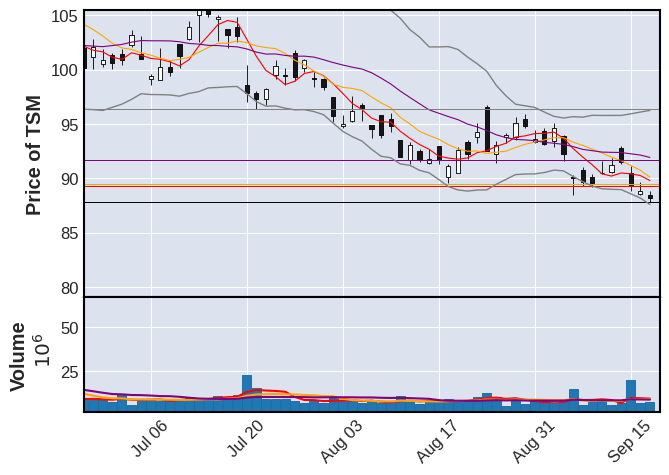

TXN,  nas snp
recent amp, 1d 5d 10d 20d: [1.29 1.23 1.84 2.05]
5d ma slope, 1m 5m 10m 20m: [-0.34 -0.16 -0.34 -0.09]
H: 163.51 L: 161.41 --- O: 162.46 Mid: 162.80 C: 163.14
pred BDup gry: 171.86
pred 5 ma red: 163.73
pred 10ma org: 163.92
pred 20ma pur: 166.38
5 day min blk: 161.41


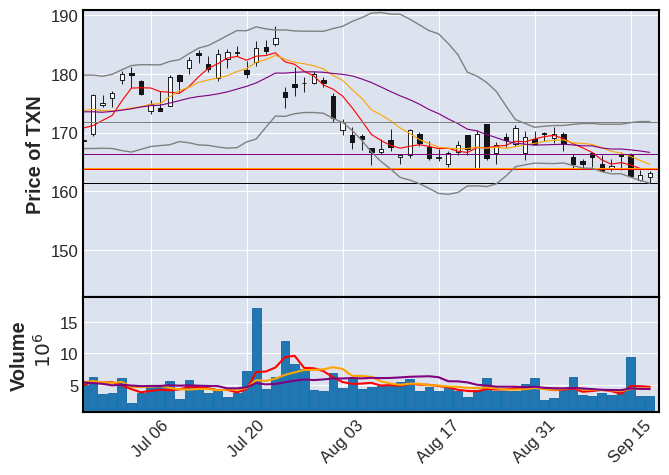

UMC, personal list only
recent amp, 1d 5d 10d 20d: [1.12 1.64 2.46 2.03]
5d ma slope, 1m 5m 10m 20m: [-0.84  0.35  0.    0.34]
H: 7.17 L: 7.09 --- O: 7.17 Mid: 7.14 C: 7.11
pred BDup gry: 7.50
pred 5 ma red: 7.24
pred 10ma org: 7.19
pred 20ma pur: 7.14
5 day min blk: 7.09


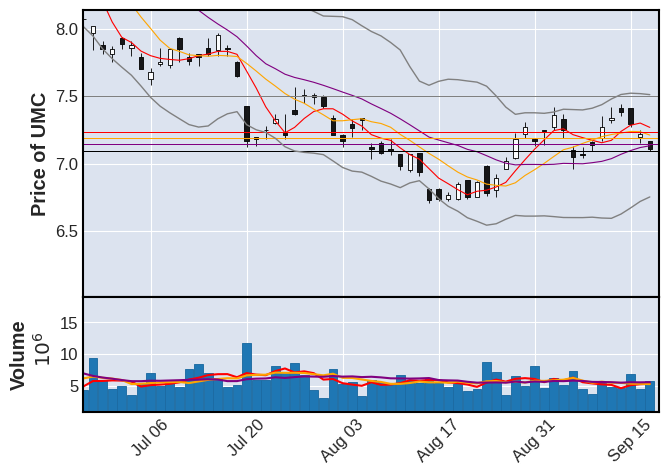

In [ ]:
# For demo purpuse, only show 5
display_full_analysis(focus, full_data, metadata_dict, volatility="low")

## dow

MMM,  dow snp
recent amp, 1d 5d 10d 20d: [1.37 6.5  1.38 1.62]
5d ma slope, 1m 5m 10m 20m: [-0.29 -1.08 -0.49  0.03]
H: 101.25 L: 99.87 --- O: 101.01 Mid: 100.62 C: 100.23
pred BDup gry: 110.03
pred 5 ma red: 99.75
pred 10ma org: 103.27
pred 20ma pur: 103.53
5 day min blk: 99.87


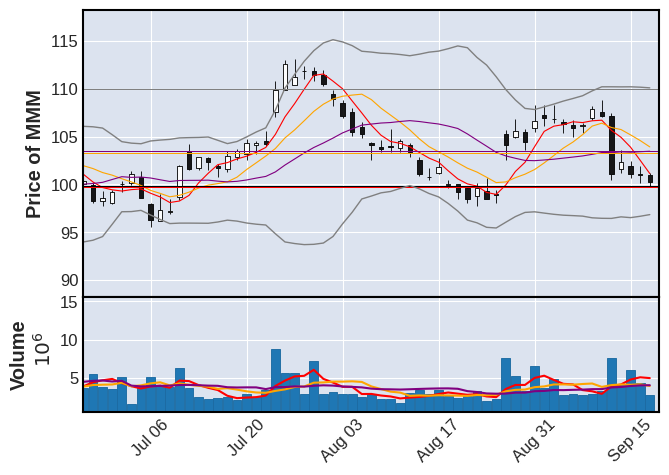

AXP,  dow snp
recent amp, 1d 5d 10d 20d: [0.89 1.31 1.87 1.65]
5d ma slope, 1m 5m 10m 20m: [-0.11  0.46  0.12  0.02]
H: 159.87 L: 158.45 --- O: 159.05 Mid: 159.20 C: 159.35
pred BDup gry: 162.20
pred 5 ma red: 160.90
pred 10ma org: 159.15
pred 20ma pur: 159.13
5 day min blk: 158.45


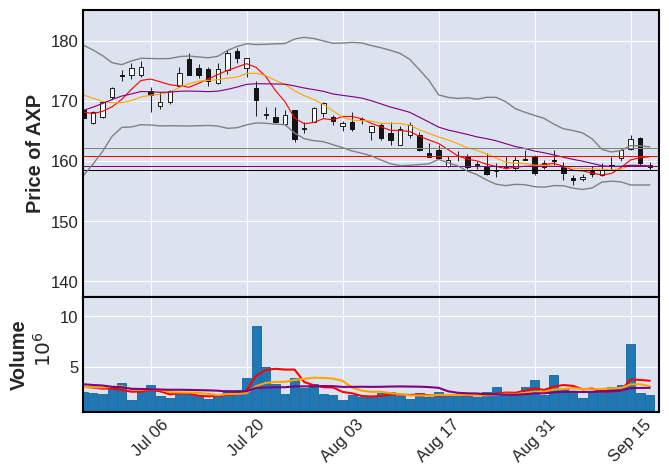

AMGN,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.27 1.23 2.38 1.17]
5d ma slope, 1m 5m 10m 20m: [ 0.58  0.25  0.24 -0.01]
H: 265.77 L: 262.44 --- O: 263.14 Mid: 263.73 C: 264.31
pred BDup gry: 265.84
pred 5 ma red: 262.34
pred 10ma org: 260.29
pred 20ma pur: 258.26
5 day min blk: 257.02


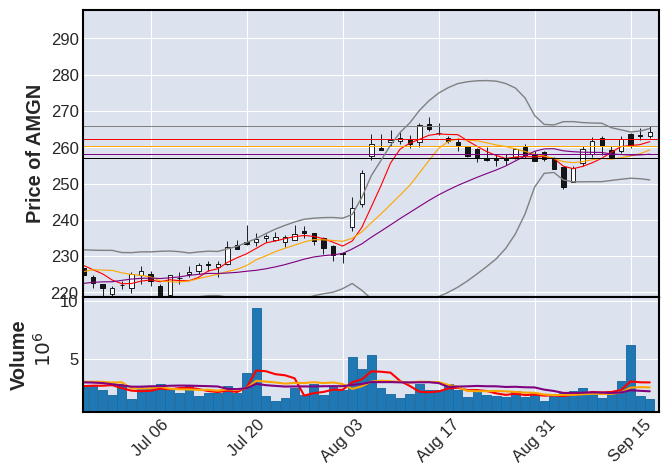

AAPL,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.41 1.88 3.92 0.81]
5d ma slope, 1m 5m 10m 20m: [ 0.69 -0.13 -0.65  0.05]
H: 179.63 L: 177.13 --- O: 177.52 Mid: 178.30 C: 179.07
pred BDup gry: 190.18
pred 5 ma red: 176.95
pred 10ma org: 176.57
pred 20ma pur: 180.59
5 day min blk: 173.58


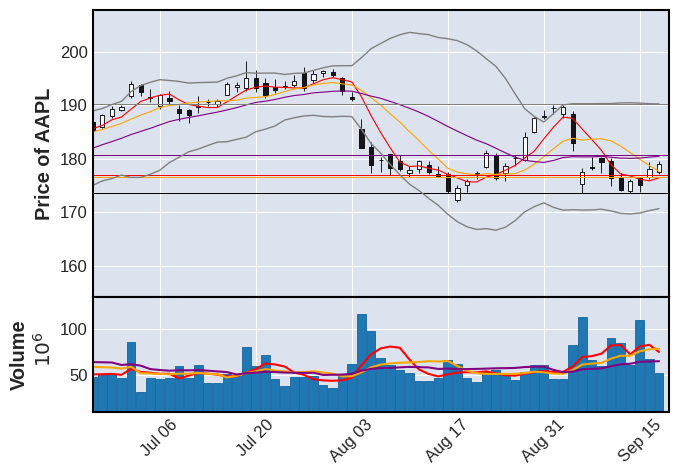

BA,  dow snp
recent amp, 1d 5d 10d 20d: [1.59 2.11 2.87 1.56]
5d ma slope, 1m 5m 10m 20m: [-0.56 -0.51 -0.82 -0.45]
H: 205.66 L: 202.39 --- O: 205.40 Mid: 204.94 C: 204.48
pred BDup gry: 234.63
pred 5 ma red: 205.80
pred 10ma org: 208.40
pred 20ma pur: 216.59
5 day min blk: 202.39


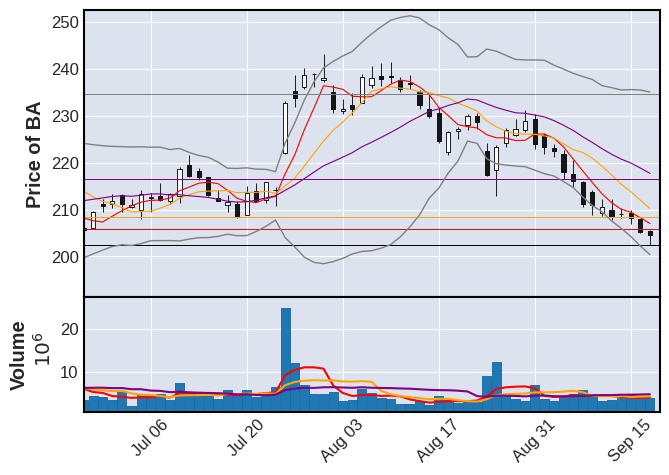

CAT,  dow snp
recent amp, 1d 5d 10d 20d: [2.09 3.47 1.94 1.63]
5d ma slope, 1m 5m 10m 20m: [ 0.21 -0.11 -0.09  0.11]
H: 283.50 L: 277.65 --- O: 280.08 Mid: 279.88 C: 279.67
pred BDup gry: 288.33
pred 5 ma red: 279.22
pred 10ma org: 280.68
pred 20ma pur: 279.34
5 day min blk: 273.03


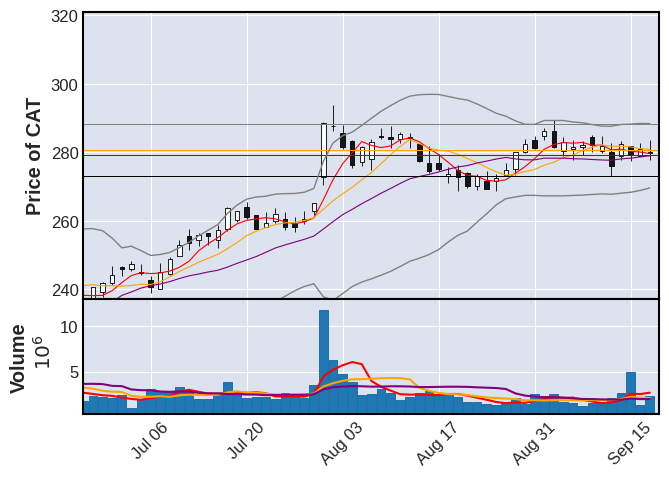

CVX,  dow snp
recent amp, 1d 5d 10d 20d: [1.5  1.3  1.12 1.42]
5d ma slope, 1m 5m 10m 20m: [0.12 0.12 0.25 0.22]
H: 168.96 L: 166.43 --- O: 168.69 Mid: 167.94 C: 167.20
pred BDup gry: 171.15
pred 5 ma red: 166.95
pred 10ma org: 166.61
pred 20ma pur: 163.99
5 day min blk: 165.58


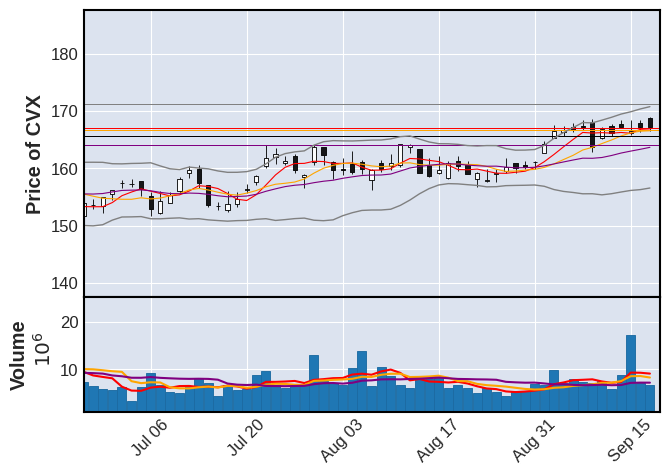

CSCO,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.33 0.8  0.7  0.97]
5d ma slope, 1m 5m 10m 20m: [-0.2  -0.21 -0.23  0.13]
H: 56.21 L: 55.46 --- O: 56.18 Mid: 56.01 C: 55.84
pred BDup gry: 57.74
pred 5 ma red: 56.02
pred 10ma org: 56.31
pred 20ma pur: 56.46
5 day min blk: 55.46


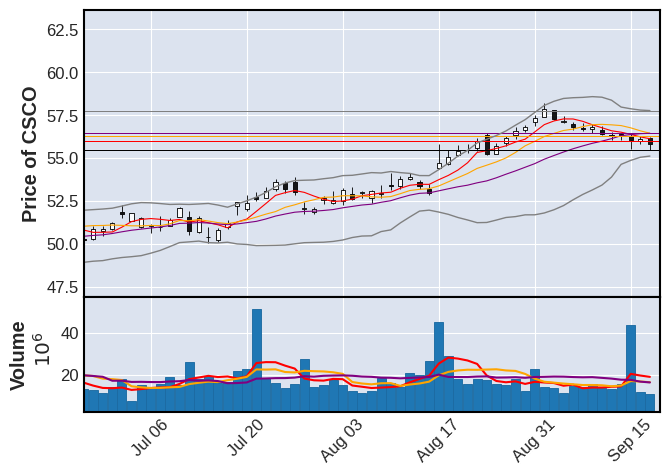

KO,  dow snp
recent amp, 1d 5d 10d 20d: [0.81 0.58 0.7  0.99]
5d ma slope, 1m 5m 10m 20m: [-0.12 -0.1  -0.24 -0.21]
H: 58.39 L: 57.92 --- O: 58.26 Mid: 58.22 C: 58.18
pred BDup gry: 60.98
pred 5 ma red: 58.24
pred 10ma org: 58.33
pred 20ma pur: 59.10
5 day min blk: 57.63


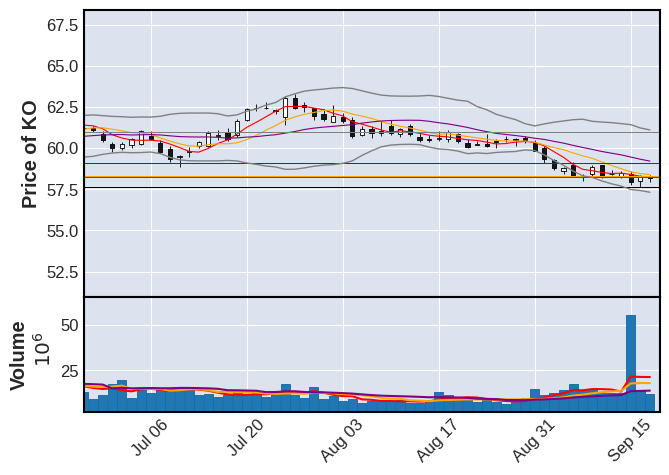

DIS,  dow snp
recent amp, 1d 5d 10d 20d: [3.67 1.12 1.93 0.84]
5d ma slope, 1m 5m 10m 20m: [-0.3   0.58  0.22 -0.09]
H: 84.79 L: 81.71 --- O: 83.92 Mid: 82.93 C: 81.94
pred BDup gry: 86.31
pred 5 ma red: 83.75
pred 10ma org: 83.06
pred 20ma pur: 83.13
5 day min blk: 81.71


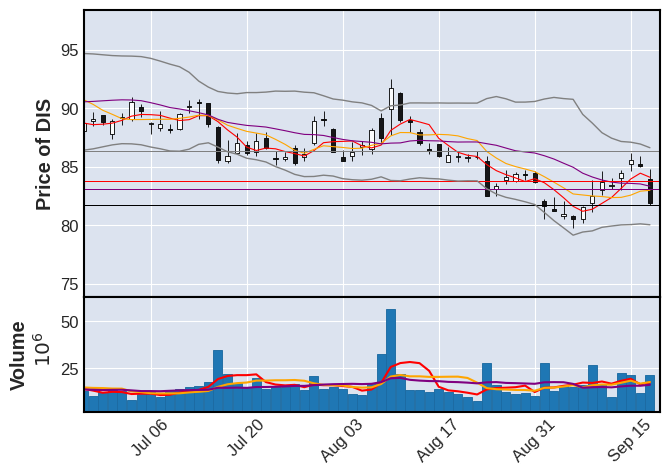

DOW,  dow snp
recent amp, 1d 5d 10d 20d: [2.58 2.28 1.87 1.76]
5d ma slope, 1m 5m 10m 20m: [-0.09 -0.08 -0.22 -0.03]
H: 53.73 L: 52.35 --- O: 53.44 Mid: 53.17 C: 52.90
pred BDup gry: 55.45
pred 5 ma red: 53.25
pred 10ma org: 53.57
pred 20ma pur: 53.95
5 day min blk: 52.35


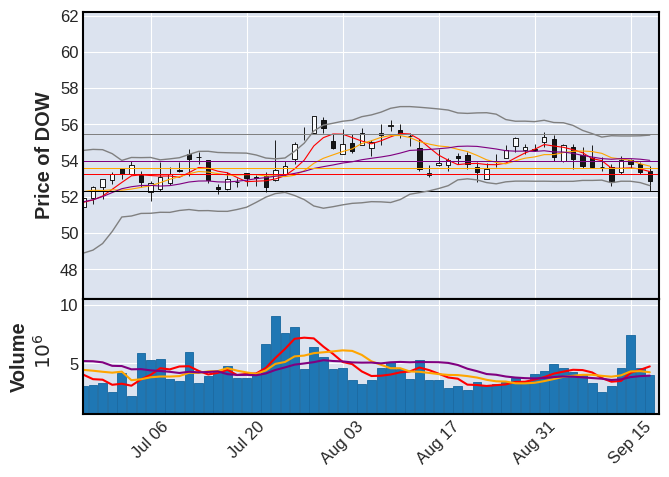

GS,  dow snp
recent amp, 1d 5d 10d 20d: [2.04 1.86 1.5  1.34]
5d ma slope, 1m 5m 10m 20m: [0.38 1.06 0.49 0.26]
H: 344.97 L: 337.97 --- O: 343.46 Mid: 342.68 C: 341.89
pred BDup gry: 347.63
pred 5 ma red: 343.66
pred 10ma org: 334.96
pred 20ma pur: 329.92
5 day min blk: 330.82


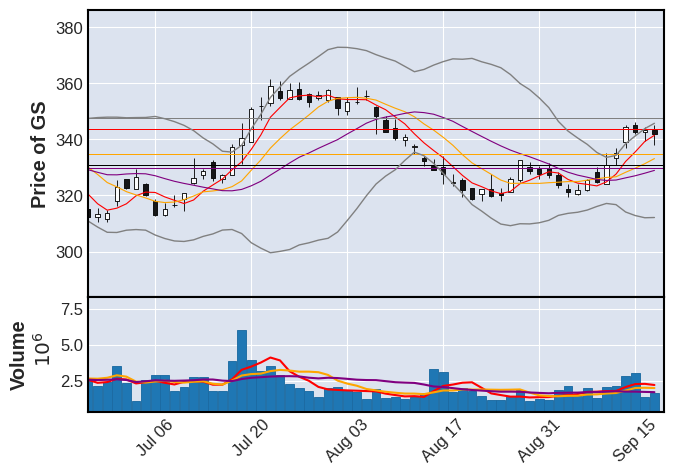

HD,  dow snp
recent amp, 1d 5d 10d 20d: [1.45 0.91 0.93 1.32]
5d ma slope, 1m 5m 10m 20m: [-1.07 -0.47 -0.31 -0.11]
H: 316.93 L: 312.34 --- O: 315.95 Mid: 315.28 C: 314.61
pred BDup gry: 336.22
pred 5 ma red: 319.42
pred 10ma org: 323.34
pred 20ma pur: 325.51
5 day min blk: 312.34


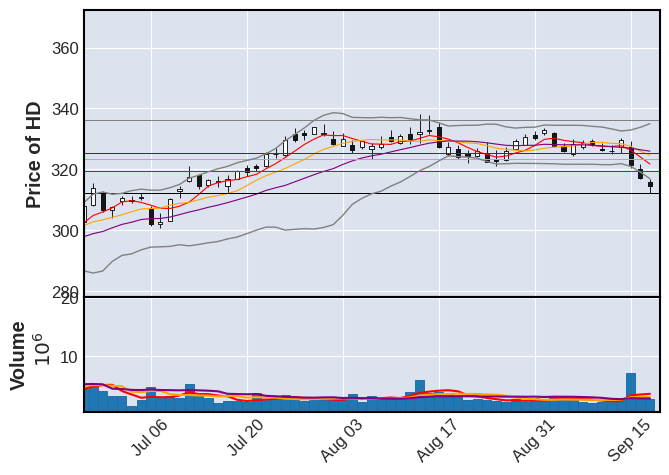

HON,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.28 2.04 1.19 1.04]
5d ma slope, 1m 5m 10m 20m: [0.44 0.87 0.34 0.2 ]
H: 195.62 L: 193.14 --- O: 193.14 Mid: 194.25 C: 195.35
pred BDup gry: 196.60
pred 5 ma red: 194.83
pred 10ma org: 190.62
pred 20ma pur: 188.88
5 day min blk: 189.79


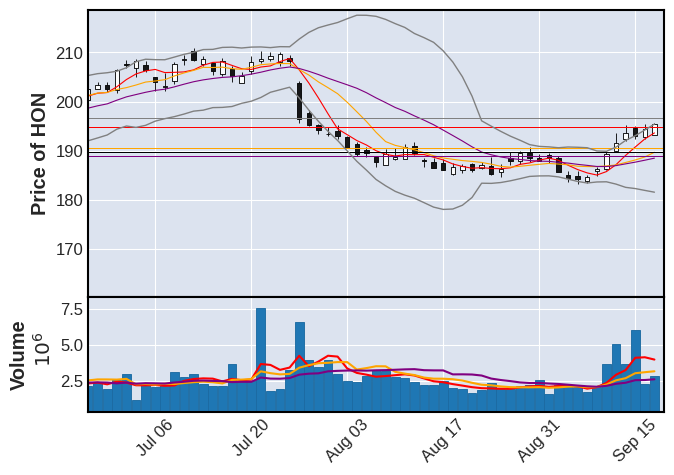

IBM,  dow snp
recent amp, 1d 5d 10d 20d: [1.42 0.73 0.82 1.35]
5d ma slope, 1m 5m 10m 20m: [-0.16 -0.2  -0.09  0.17]
H: 146.72 L: 144.66 --- O: 145.00 Mid: 145.76 C: 146.52
pred BDup gry: 149.63
pred 5 ma red: 146.34
pred 10ma org: 146.78
pred 20ma pur: 146.49
5 day min blk: 144.66


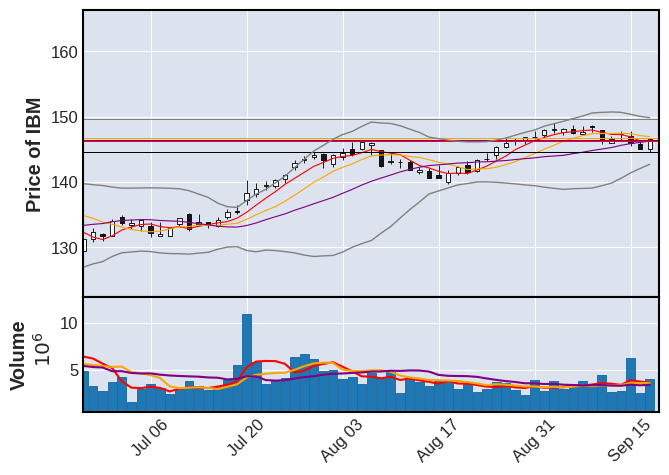

INTC,  dow nas snp
recent amp, 1d 5d 10d 20d: [5.47 2.32 2.76 2.92]
5d ma slope, 1m 5m 10m 20m: [-1.4  -0.32  0.53  0.69]
H: 38.10 L: 36.02 --- O: 38.04 Mid: 37.19 C: 36.34
pred BDup gry: 40.53
pred 5 ma red: 37.41
pred 10ma org: 37.98
pred 20ma pur: 36.35
5 day min blk: 36.02


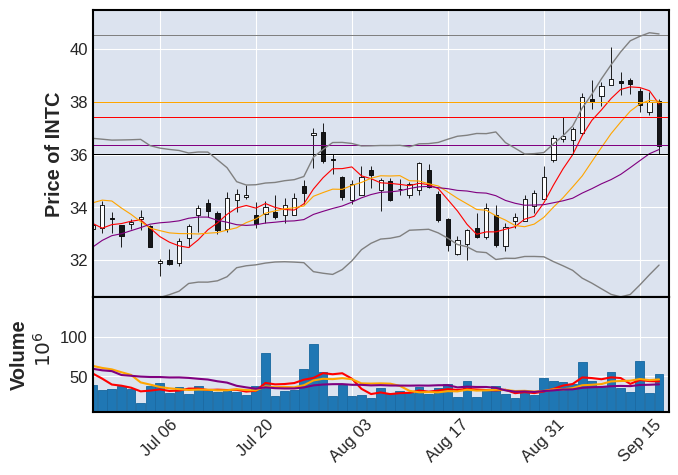

JNJ,  dow snp
recent amp, 1d 5d 10d 20d: [0.91 1.19 1.66 1.46]
5d ma slope, 1m 5m 10m 20m: [-0.3   0.08  0.05 -0.29]
H: 162.85 L: 161.38 --- O: 162.25 Mid: 162.22 C: 162.20
pred BDup gry: 166.39
pred 5 ma red: 162.49
pred 10ma org: 162.02
pred 20ma pur: 162.53
5 day min blk: 160.75


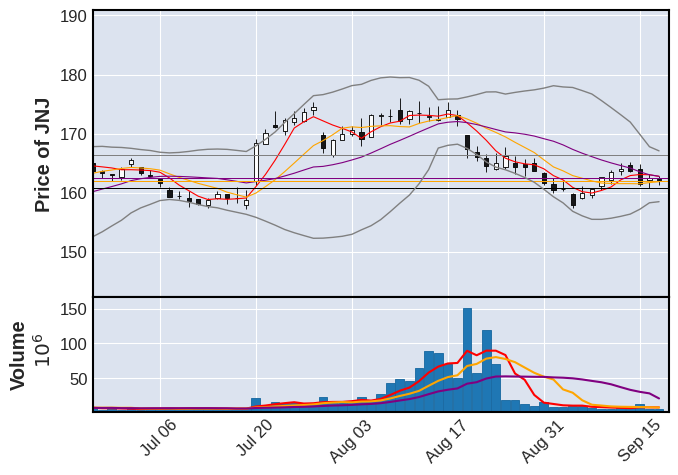

JPM,  dow snp
recent amp, 1d 5d 10d 20d: [1.68 1.28 0.99 2.54]
5d ma slope, 1m 5m 10m 20m: [ 0.34  0.62  0.16 -0.01]
H: 149.72 L: 147.21 --- O: 149.50 Mid: 149.21 C: 148.93
pred BDup gry: 150.20
pred 5 ma red: 149.02
pred 10ma org: 146.96
pred 20ma pur: 146.81
5 day min blk: 145.82


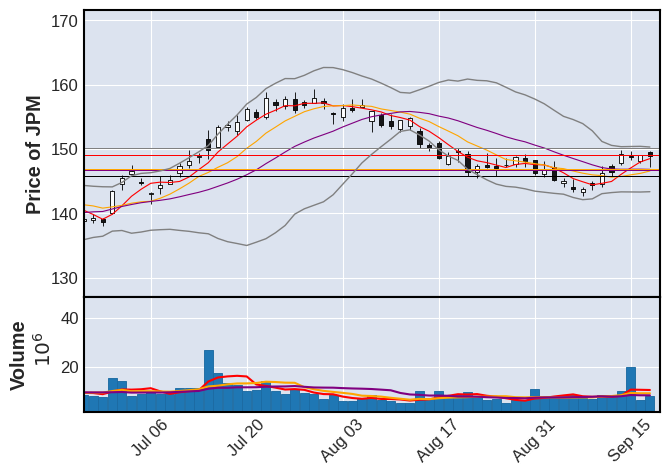

MCD,  dow snp
recent amp, 1d 5d 10d 20d: [0.66 0.81 1.31 0.62]
5d ma slope, 1m 5m 10m 20m: [-0.51 -0.01 -0.07 -0.05]
H: 278.26 L: 276.44 --- O: 276.44 Mid: 277.29 C: 278.13
pred BDup gry: 286.01
pred 5 ma red: 279.61
pred 10ma org: 279.30
pred 20ma pur: 280.70
5 day min blk: 276.44


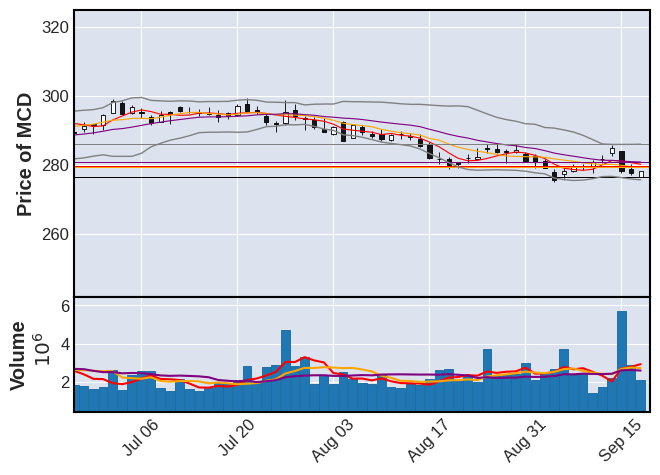

MRK,  dow snp
recent amp, 1d 5d 10d 20d: [1.18 1.84 1.95 2.19]
5d ma slope, 1m 5m 10m 20m: [-0.12 -0.18 -0.14 -0.06]
H: 108.18 L: 106.91 --- O: 107.65 Mid: 107.51 C: 107.36
pred BDup gry: 111.09
pred 5 ma red: 107.42
pred 10ma org: 107.97
pred 20ma pur: 108.56
5 day min blk: 106.85


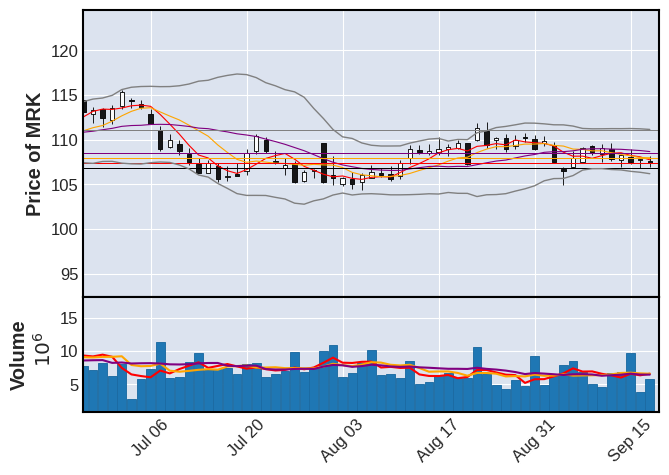

MSFT,  dow nas snp
recent amp, 1d 5d 10d 20d: [1.5  1.71 1.28 1.42]
5d ma slope, 1m 5m 10m 20m: [-0.73 -0.16  0.06  0.2 ]
H: 329.39 L: 324.51 --- O: 326.17 Mid: 327.41 C: 328.65
pred BDup gry: 339.49
pred 5 ma red: 331.91
pred 10ma org: 332.46
pred 20ma pur: 329.98
5 day min blk: 324.51


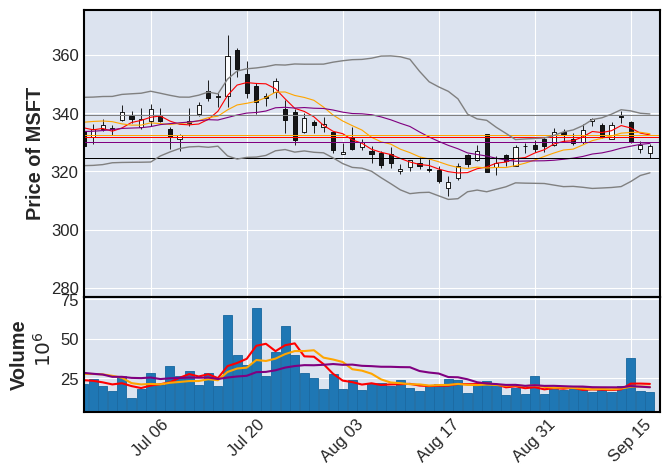

NKE,  dow snp
recent amp, 1d 5d 10d 20d: [1.14 1.6  1.28 1.62]
5d ma slope, 1m 5m 10m 20m: [-0.49 -0.27 -0.59 -0.45]
H: 95.49 L: 94.41 --- O: 95.04 Mid: 94.83 C: 94.62
pred BDup gry: 103.12
pred 5 ma red: 95.61
pred 10ma org: 96.29
pred 20ma pur: 98.25
5 day min blk: 94.41


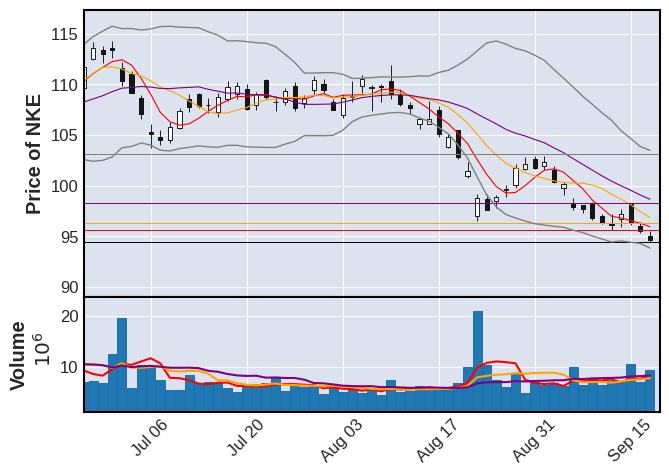

PG,  dow snp
recent amp, 1d 5d 10d 20d: [1.51 1.27 0.6  0.81]
5d ma slope, 1m 5m 10m 20m: [ 0.02  0.07 -0.    0.05]
H: 154.06 L: 151.74 --- O: 153.75 Mid: 153.68 C: 153.60
pred BDup gry: 155.15
pred 5 ma red: 154.11
pred 10ma org: 153.56
pred 20ma pur: 153.52
5 day min blk: 151.66


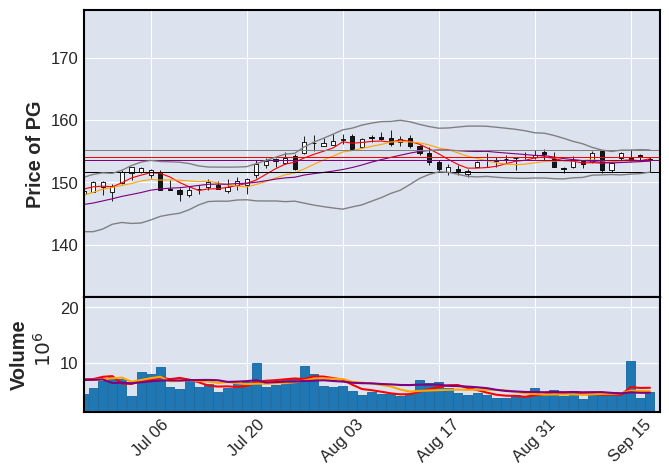

CRM,  dow snp
recent amp, 1d 5d 10d 20d: [1.77 1.61 1.45 1.96]
5d ma slope, 1m 5m 10m 20m: [-0.46 -0.73 -0.17  0.23]
H: 216.06 L: 212.26 --- O: 214.39 Mid: 215.04 C: 215.70
pred BDup gry: 228.27
pred 5 ma red: 215.39
pred 10ma org: 219.58
pred 20ma pur: 216.84
5 day min blk: 212.26


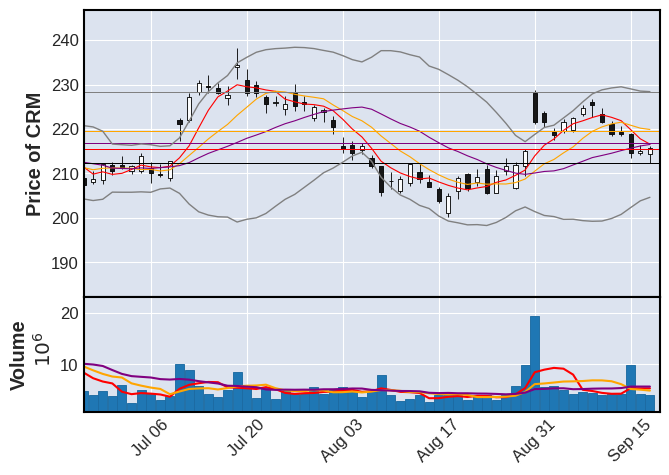

TRV,  dow snp
recent amp, 1d 5d 10d 20d: [0.97 1.13 1.39 1.56]
5d ma slope, 1m 5m 10m 20m: [0.55 0.64 0.29 0.09]
H: 167.93 L: 166.30 --- O: 167.34 Mid: 167.26 C: 167.19
pred BDup gry: 167.64
pred 5 ma red: 166.47
pred 10ma org: 163.98
pred 20ma pur: 162.51
5 day min blk: 161.75


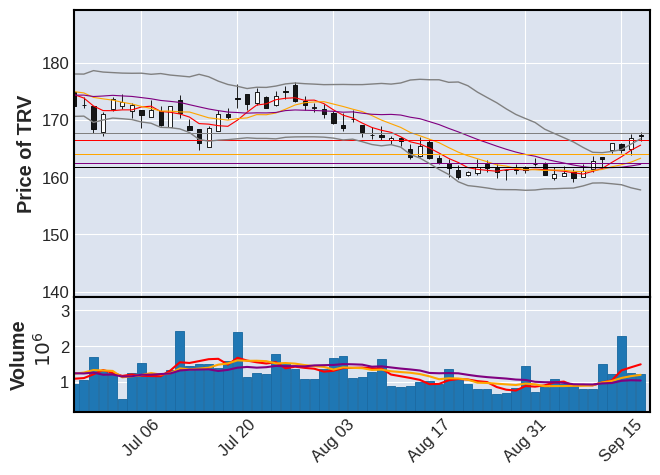

UNH,  dow snp
recent amp, 1d 5d 10d 20d: [1.9  0.95 1.41 1.1 ]
5d ma slope, 1m 5m 10m 20m: [ 0.09  0.15  0.09 -0.14]
H: 485.73 L: 476.54 --- O: 483.76 Mid: 482.21 C: 480.66
pred BDup gry: 493.33
pred 5 ma red: 483.52
pred 10ma org: 481.85
pred 20ma pur: 483.50
5 day min blk: 476.54


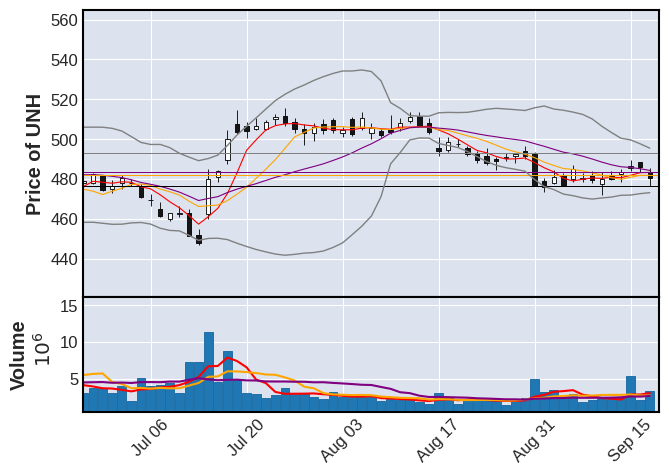

VZ,  dow snp
recent amp, 1d 5d 10d 20d: [1.43 2.3  1.32 1.3 ]
5d ma slope, 1m 5m 10m 20m: [-0.42 -0.06 -0.31  0.08]
H: 33.73 L: 33.25 --- O: 33.58 Mid: 33.49 C: 33.40
pred BDup gry: 34.99
pred 5 ma red: 33.60
pred 10ma org: 33.71
pred 20ma pur: 33.93
5 day min blk: 33.25


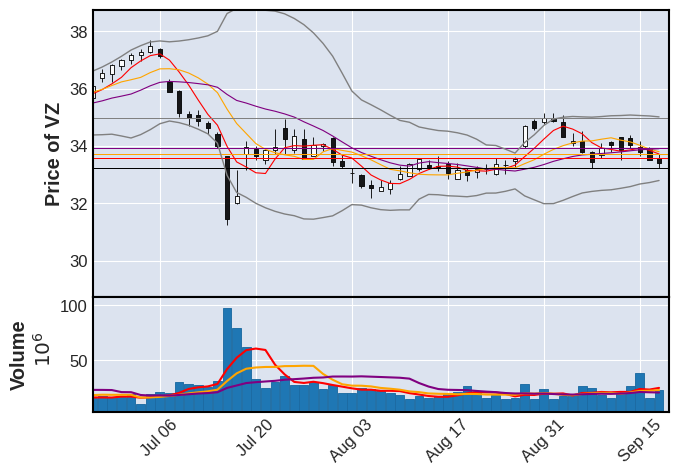

V,  dow snp
recent amp, 1d 5d 10d 20d: [1.49 1.4  1.   1.15]
5d ma slope, 1m 5m 10m 20m: [-0.22 -0.36 -0.15  0.09]
H: 245.12 L: 241.46 --- O: 245.00 Mid: 244.28 C: 243.56
pred BDup gry: 249.69
pred 5 ma red: 242.98
pred 10ma org: 245.20
pred 20ma pur: 244.86
5 day min blk: 238.75


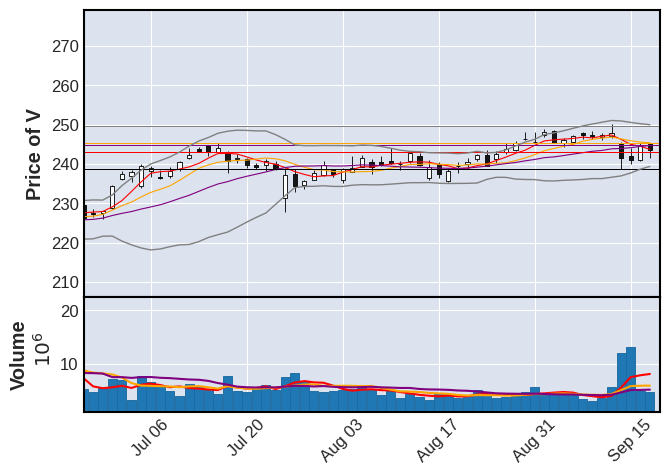

WBA,  dow nas snp
recent amp, 1d 5d 10d 20d: [2.2  2.12 1.95 2.23]
5d ma slope, 1m 5m 10m 20m: [-0.01  0.46 -0.88 -0.97]
H: 22.50 L: 22.01 --- O: 22.25 Mid: 22.14 C: 22.03
pred BDup gry: 26.85
pred 5 ma red: 22.27
pred 10ma org: 22.01
pred 20ma pur: 23.39
5 day min blk: 21.48
--- CAUTION --- EXTREME volatility --- CAUTION ---


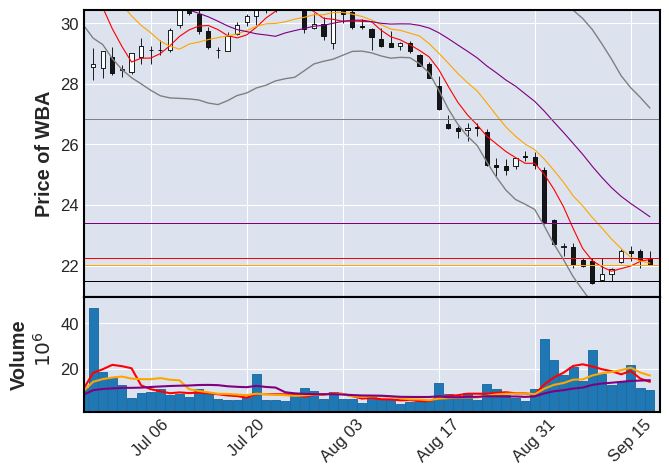

WMT,  dow snp
recent amp, 1d 5d 10d 20d: [0.88 0.9  1.41 0.68]
5d ma slope, 1m 5m 10m 20m: [-0.25  0.01  0.16  0.21]
H: 163.78 L: 162.35 --- O: 163.38 Mid: 163.38 C: 163.38
pred BDup gry: 167.25
pred 5 ma red: 164.02
pred 10ma org: 164.19
pred 20ma pur: 161.95
5 day min blk: 162.35


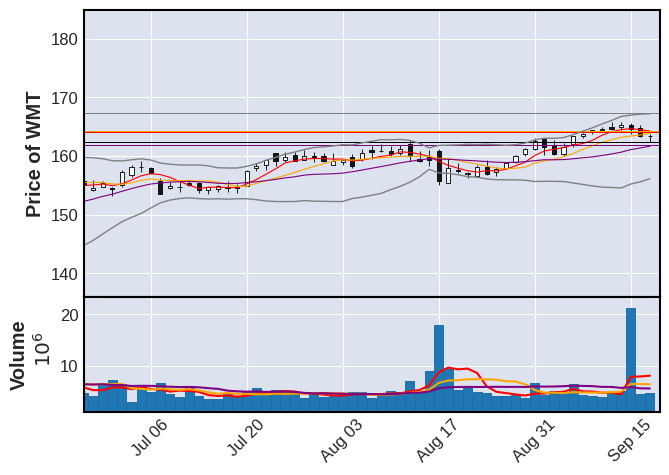

In [ ]:
# For demo purpuse, only show 5
display_full_analysis(dow_list, full_data, metadata_dict, volatility="low")

# Open websites for stock info

In [ ]:
from IPython.display import Javascript, clear_output
import time

def open_web(target):
  for t in target:
    url1 = f"https://statementdog.com/analysis/{t}/"
    # display(Javascript('window.open("{url}");'.format(url=url1)))

    url2 = f"https://finance.yahoo.com/quote/{t}/chart"
    display(Javascript('window.open("{url}");'.format(url=url2)))

    time.sleep(2)

  time.sleep(2)
  clear_output()


In [ ]:
# cand1 = "WFRD MAT IHRT CHX SLDP ULCC WW OLLI TDW KRUS DLB CLH PRCT RHI ASO CLSK HCCI QTRX HLT TRDA AMPS MTRN NEX NE VAL"
# cand2 = "WFRD CHX ULCC OLLI TDW KRUS DLB CLH CLSK HCCI QTRX HLT AMPS MTRN NEX NE VAL"
cand = "HAYW LAUR WMS FRPT OLED TNC ICFI TT EHC CNK ROCK STEP"

candidates = cand.split(" ")

# candidates = list(worth_analysis.keys())

In [ ]:
# open_web(candidates)